# Capstone IV: Implementing CNNs, ViT, Transfer Learning and Fine Tuning in the detection of human cancer


Convolutional Neural Networks (CNNs) are a type of deep learning network that have become the go-to for object detection and classification in image analysis. [CNNs in Healthcare](https://geekyants.com/en-us/blog/deep-learning-and-neural-networks-enabling-ai-in-healthcare) are “renowned for its proficiency in image analysis” of complex visual data and have “demonstrated unparalleled accuracy in diagnosing medical conditions.” [Recent studies](https://www.breastcancer.org/screening-testing/artificial-intelligence) (2020-2023) found that AI has markedly augmented the care of breast cancer patients:
* 20% more cancers detected (than the radiologist-only group)
* 2.6% improvement in the detection of breast cancer (than a radiologist alone)
* Lower rate of false positives by almost 6% in the US and 1.2% in the UK * iBRISK (intelligent-augmented breast cancer risk calculator) accurately predicted whether abnormal tissue flagged by doctors was more likely to be benign or cancerous


Vision Transformers (ViTs), unlike CNNs, are based on the Transformer architecture and have been adapted for image analysis. Since the introduction of the Transformer to the field in 2017, ViTs “[have started overcoming the performance of CNNs](https://www.edge-ai-vision.com/2024/03/vision-transformers-vs-cnns-at-the-edge/#:~:text=A%3A%20The%20main%20difference%20lies,relations%20between%20image%20patches%20directly.),” providing additional powerful AI tools for further augmenting patient care.


Transfer Learning and Fine tuning can be applied when using either CNNs or ViTs. Transfer Learning involves the use of a pre-trained model, leveraging the knowledge the model has already gained to detect the important feature(s) in the image of a new, unseen image dataset. Fine tuning can be used to improve the accuracy of the image analysis models. One common Fine-tuning approach is retraining of only the layers specific to the new task (i.e., the final layer or layers of the model in a classification task). Another Fine-tuning approach involves changing various hyperparameters to improve model accuracy and performance.

The development of “[more accurate and automated mechanisms for identifying skin cancer](https://www.nature.com/articles/s41598-024-54212-8#ref-CR1)” through Fine Tuning and Transfer Learning is a highly active area of research. In my final capstone, I will be implementing a baseline CNN in an image classification task and compare its performance with pre-trained/Transfer Learning CNN and ViT models in the detection and diagnostic prediction of human skin cancer. Presently, diagnosis of skin cancer depends on dermatologists’ “professional knowledge and visual examination,” which is “[inherently subjective and prone to diagnostic inaccuracies](https://www.mdpi.com/2227-7390/11/16/3601).”

I will model my work after an  exemplary notebook by Matthew Jansen ([Transfer Learning | Skin Cancer Classification](https://www.mdpi.com/2227-7390/11/16/3601)), and use [Benchmark Datasets from the International Skin Imaging Collaboration](. I will select and run a CNN (VGG16, VGG19, ConvNext, or Resnet), a ViT (Swin ViT, Conv ViT/CvT, DiNAT, DETR), and corresponding Transfer Learning models (see Hugging Face Community Computer Vision Course Units 2 and 3). While Fine Tuning may be beyond the scope of both this project and the knowledge base I have built thus far, I can advance my analysis and efforts by applying the best performing model to a new, similar dataset and assess its generalizability (accuracy and robustness/invariance to transformations in the dataset). This new dataset can either be a different dataset (i.e., not the original dataset used to train and validate) composed of similar images or the original dataset that has been transformed and increased in size by the Albumentations library.

Because this is a binary classification task, I’ll use the following metrics to evaluate the performance of the models: accuracy, precision, recall, F1 or F-beta score and either the ROC curve (if classes are balanced) or Precision-Recall curve (if classes are imbalanced). I hope, timeframe willing, that I will be able to explore and attempt some Fine Tuning to the best performing model to see if its performance can be improved further.

The goals of this project are to demonstrate 1) a functional understanding of Computer Vision and 2) a functional and useful implementation of CNNs, ViTs and Transfer Learning. I want to demonstrate that I can use and assess extant models/tools for a given computer vision task then determine the best solution for the task.

**Additional Context**

For this Capstone, I went beyond the program and course material, and sought additional educational resources to learn about Computer Vision, Object Detection, CNNs and ViTs. As such, the contents of this notebook are non-linear and very much reflect my learning process as someone who is attempting to execute CNN and ViT code for the first time and without formal instruction. I am grateful for my Mentor, who introduced me to the Hugging Face Computer Vision course and other important educational resources on object detection, and provided critical guidance and feedback during my self-imposed crash course in Computer Vision.  

In [ ]:
# General imports

import random
import os
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import copy


import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
      accuracy_score,
      f1_score,
      matthews_corrcoef,
      confusion_matrix,
      ConfusionMatrixDisplay,
      classification_report,
      precision_recall_fscore_support,
      precision_recall_curve,
      PrecisionRecallDisplay,
      precision_score,
      recall_score,
      RocCurveDisplay,
      roc_auc_score,
      roc_curve,
)

# To save a Notebook session

!pip install dill
import dill

import warnings
warnings.filterwarnings('ignore')

#!pip install scikit-plot
#import scikitplot as skplt
#from scikitplot.metrics import plot_roc, plot_precision_recall



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 7.9 MB/s eta 0:00:00


In [ ]:
# Imports from https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch

# Import essential libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style='darkgrid')
import copy # A module that provides functions for creating copies of objects, useful for avoiding unintended modifications to variables.
import os # A module that provides a way to interact with the operating system, allowing for tasks such as file and directory manipulation.
import torch
from PIL import Image # A module from the Python Imaging Library (PIL) that provides functionality for opening, manipulating, and saving various image file formats.
from torch.utils.data import Dataset # A PyTorch class that represents a dataset and provides an interface for accessing and processing the data during training.
import torchvision
import torchvision.transforms as transforms # A module from the torchvision library that provides common image transformations, such as resizing, cropping, and normalization.
from torch.utils.data import random_split # A function from PyTorch that allows for randomly splitting a dataset into training and validation subsets.
from torch.optim.lr_scheduler import ReduceLROnPlateau # A PyTorch scheduler that adjusts the learning rate during training based on a specified metric, reducing it when the metric plateaus.
import torch.nn as nn # A module in PyTorch that provides classes for defining and building neural networks.
from torchvision import utils # A module from torchvision that contains utility functions for working with images, such as saving and visualizing them.
from torchvision.datasets import ImageFolder
#import splitfolders
from torchsummary import summary
import torch.nn.functional as F
import pathlib
from sklearn.metrics import confusion_matrix, classification_report
import itertools # This import statement imports the itertools module, which provides functions for efficient looping and combining of iterables. It can be used for tasks such as generating combinations or permutations of elements.
from tqdm.notebook import trange, tqdm # These functions allow for the creation of progress bars to track the progress of loops or tasks.
from torch import optim
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Tensorflow imports

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model

# PyTorch imports

import torch
import torch.nn as nn
import torch.optim as optim # For optimization
import torch.nn.functional as F   # For NN operations
from torch.utils.data import Dataset, DataLoader # To handle image datasets

In [ ]:
# Define a class configuration for ML model
# for Tensorflow

class CFG_tf:
    EPOCHS = 10
    BATCH_SIZE = 32
    SEED = 42
    TF_SEED = 768
    HEIGHT = 224
    WIDTH = 224
    CHANNELS = 3
    IMAGE_SIZE = (224, 224, 3)

# seed_everything function sets the seed for
# various random number generators,
# ensuring experiments are reproducible

def seed_everything_tf(seed=CFG_tf.SEED):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_everything_tf(CFG_tf.SEED)

# Define a class configuration for ML model
# for PyTorch

class CFG_pt:
    EPOCHS = 10
    BATCH_SIZE = 32
    SEED = 42
    HEIGHT = 224
    WIDTH = 224
    CHANNELS = 3
    IMAGE_SIZE = (224, 224)
    LEARNING_RATE = 0.001

# seed_everything function sets the seed for
# various random number generators,
# ensuring experiments are reproducible

def seed_everything_pt(seed=CFG_pt.SEED):
    random.seed(seed)  # Python's built-in random module
    np.random.seed(seed)  # NumPy's random module
    torch.manual_seed(seed)  # PyTorch CPU seed
    torch.cuda.manual_seed(seed)  # PyTorch GPU seed
    torch.cuda.manual_seed_all(seed)  # If you have multi-GPU setup
    torch.backends.cudnn.deterministic = True  # Makes the model deterministic
    torch.backends.cudnn.benchmark = False  # Disables benchmark mode

# Call the function to set the seed
seed_everything_pt(CFG_pt.SEED)



## Download the ISIC dataset from Kaggle

In [ ]:
# Download the datasets

!pip install kaggle

!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d fanconic/skin-cancer-malignant-vs-benign
!unzip skin-cancer-malignant-vs-benign.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/train/benign/420.jpg  
  inflating: data/train/benign/421.jpg  
  inflating: data/train/benign/422.jpg  
  inflating: data/train/benign/423.jpg  
  inflating: data/train/benign/424.jpg  
  inflating: data/train/benign/425.jpg  
  inflating: data/train/benign/426.jpg  
  inflating: data/train/benign/429.jpg  
  inflating: data/train/benign/43.jpg  
  inflating: data/train/benign/430.jpg  
  inflating: data/train/benign/431.jpg  
  inflating: data/train/benign/432.jpg  
  inflating: data/train/benign/434.jpg  
  inflating: data/train/benign/435.jpg  
  inflating: data/train/benign/438.jpg  
  inflating: data/train/benign/439.jpg  
  inflating: data/train/benign/440.jpg  
  inflating: data/train/benign/441.jpg  
  inflating: data/train/benign/442.jpg  
  inflating: data/train/benign/443.jpg  
  inflating: data/train/benign/445.jpg  
  inflating: data/train/benign/446.jpg  
  inflating: data/train/benign/447.jpg  
  infla

In [ ]:
# Ensure the data is in the directory

!ls /content/

data  drive  sample_data  skin-cancer-malignant-vs-benign.zip  test  train


In [ ]:
# Define paths

TRAIN_PATH = "/content/train/"
TEST_PATH = "/content/test/"

# Verify contents of the folders

!ls /content/train
!ls /content/test


benign	malignant
benign	malignant


In [ ]:
# Generate a summary of the dataset
# os.walk() funciton walks through all directories
# and subdirectories starting from the given path

# Function to generate summary for a given path
def generate_summary(path, dataset_name):
    print(f'{dataset_name} DATASET SUMMARY')
    print('========================\n')

    # Walk through the directory structure
    for dirpath, dirnames, filenames in os.walk(path):
        print(f"There are {len(dirnames)} subdirectories and {len(filenames)} images in {dirpath}")

    print('\n========================\n')

# Generate summary for the training and test datasets
generate_summary(TRAIN_PATH, "TRAIN")
generate_summary(TEST_PATH, "TEST")

TRAIN DATASET SUMMARY

There are 2 subdirectories and 0 images in /content/train/
There are 0 subdirectories and 1440 images in /content/train/benign
There are 0 subdirectories and 1197 images in /content/train/malignant


TEST DATASET SUMMARY

There are 2 subdirectories and 0 images in /content/test/
There are 0 subdirectories and 360 images in /content/test/benign
There are 0 subdirectories and 300 images in /content/test/malignant




In [ ]:
# Get image paths with glob
# https://docs.python.org/3/library/glob.html

%%time
train_images = glob.glob(f"{TRAIN_PATH}**/*.jpg")
test_images = glob.glob(f"{TEST_PATH}**/*.jpg")

CPU times: user 12.9 ms, sys: 0 ns, total: 12.9 ms
Wall time: 34.9 ms


In [ ]:
# View the number of images present in the datasets

# Get train & test set sizes

train_size = len(train_images)
test_size = len(test_images)

# Get dataset size

total = train_size + test_size

# View samples counts

print(f'train samples count:\t\t{train_size}')
print(f'test samples count:\t\t{test_size}')
print('=======================================')
print(f'TOTAL:\t\t\t\t{total}')

train samples count:		2637
test samples count:		660
TOTAL:				3297


In [ ]:
# Save Notebook session so that data
# doesn't need to be downloaded again
# https://stackoverflow.com/questions/34342155/how-to-pickle-or-store-jupyter-ipython-notebook-session-for-later

dill.dump_session('notebook_env.db')

In [ ]:
# Confirm file is in directory

print(os.getcwd())
print(os.listdir())

/content
['.config', 'data', 'skin-cancer-malignant-vs-benign.zip', 'drive', 'train', 'notebook_env.db', 'test', 'sample_data']


## Create Pandas DataFrames for Train and Test images (TensorFlow &rarr; PyTorch conversions)

The [model code/Kaggle notebook](https://www.kaggle.com/code/matthewjansen/transfer-learning-skin-cancer-classification) that I'm using is TensorFlow based. Initially, I thought this code could be adapted or modified such that its outputs would be compatible with PyTorch (I haven't implemented PyTorch code or models yet), but I quickly realized PyTorch has its own ecosystem and specific requirements. This particular portion of the notebook turned out to be an exercise in identifying the PyTorch-equivalent steps and functions then converting the outputs (originally meant for TensorFlow) to Torch equivalents (e.g., numpy arrays &rarr; PyTorch tensors; Pandas DataFrame &rarr; PyTorch tensors-dataframe).

In [ ]:
# Create Pandas DataFrames for paths and labels

def generate_labels(image_paths):
    return [_.split('/')[-2:][0] for _ in image_paths]


def build_df(image_paths, labels):
    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': generate_labels(labels)
    })

    # Generate label encodings
    df['label_encoded'] = df.apply(lambda row: 0 if row.label == 'malignant' else 1, axis=1)

    # Shuffle and return df
    return df.sample(frac=1, random_state=CFG_pt.SEED).reset_index(drop=True)

# Build the train and test DataFrames

train_df = build_df(train_images, generate_labels(train_images))
test_df = build_df(test_images, generate_labels(test_images))

In [ ]:
# View the first three samples in train_df

train_df.head(3)

,image_path,label,label_encoded
0,/content/train/malignant/132.jpg,malignant,0
1,/content/train/benign/1434.jpg,benign,1
2,/content/train/benign/1582.jpg,benign,1


In [ ]:
# View the first three samples in test_df

test_df.head(3)

,image_path,label,label_encoded
0,/content/test/malignant/436.jpg,malignant,0
1,/content/test/malignant/1229.jpg,malignant,0
2,/content/test/benign/1074.jpg,benign,1


Note the encoded label for each class:

* **Benign = 1**
* **Malignant = 0**

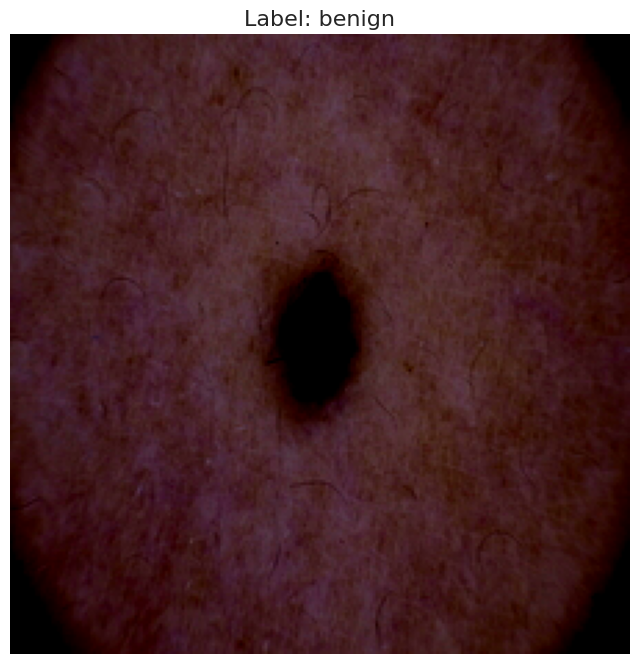

In [ ]:
# Load and view random sample image

import random
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import torch

def _load(image_path):
    # Read and decode an image file
    image = Image.open(image_path).convert('RGB')

    # Define transformations
    # Resize image
    # Convert image to tensor
    # Normalize to [-1, 1]
    transform = transforms.Compose([
        transforms.Resize((CFG_pt.HEIGHT, CFG_pt.WIDTH)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    # Apply transformations
    image = transform(image)

    return image

def view_sample(image, label, color_map='rgb', fig_size=(8, 10)):
    plt.figure(figsize = fig_size)

    if color_map == 'rgb':
        # Convert tensor back to numpy for viewing
        plt.imshow(image.permute(1, 2, 0).numpy())
    else:
        plt.imshow(image.permute(1, 2, 0).numpy(), cmap=color_map)

    plt.title(f'Label: {label}', fontsize=16)
    plt.axis('off')  # Hide axes
    plt.show()
    return

# Select random sample from train_df
idx = random.sample(range(len(train_df)), 1)[0]

# Load the random sample and label
sample_image = _load(train_df.image_path[idx])
sample_label = train_df.label[idx]

# View the random sample
view_sample(sample_image, sample_label, color_map='inferno')


In [ ]:
# Sanity check to ensure the data type is PyTorch tensor

type(sample_image)

torch.Tensor

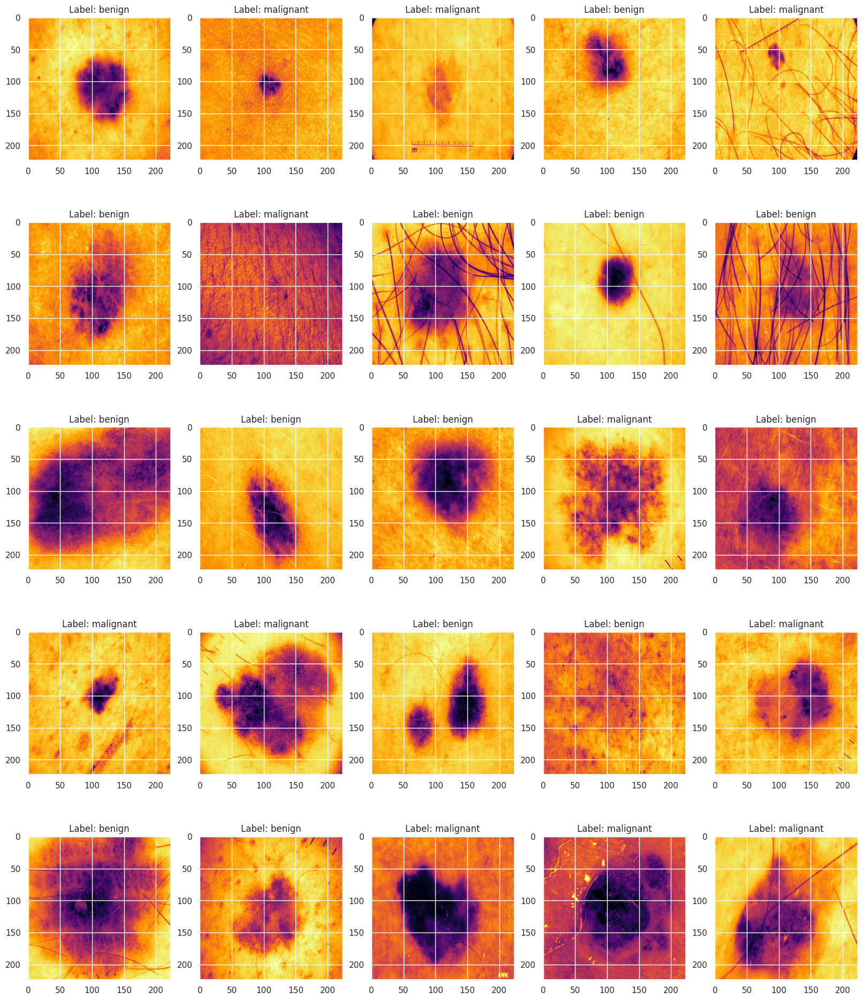

In [ ]:
# View multiple random sample images

def view_mulitiple_samples(df, sample_loader, count=10, color_map='rgb', fig_size=(14, 10)):
    rows = count//5
    if count%5 > 0:
        rows +=1

    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column+1)
        plt.title(f'Label: {df.label[_]}')

        if color_map == 'rgb':
          # Load and display the image in RGB
          img_tensor = sample_loader(df.image_path[_])
          plt.imshow(img_tensor.permute(1, 2, 0).numpy())  # Change shape to (H, W, C)
        else:
          # Convert to grayscale and display using the specified color map
          img_tensor = sample_loader(df.image_path[_])
          gray_img = transforms.functional.rgb_to_grayscale(img_tensor)  # Convert to grayscale
          plt.imshow(gray_img[0].numpy(), cmap = color_map)  # Display the first channel

    return

view_mulitiple_samples(train_df, _load,
                       count = 25, color_map ='inferno',
                       fig_size = (20, 24))

*Note that all images in the ISIC are not uniform*

* Some images include the affected extremity
* Some images contain a ruler or similar scalar element

These are important considerations to note in computer vision tasks, as the model "sees" all elements in an image and evaluates them during model development and training.

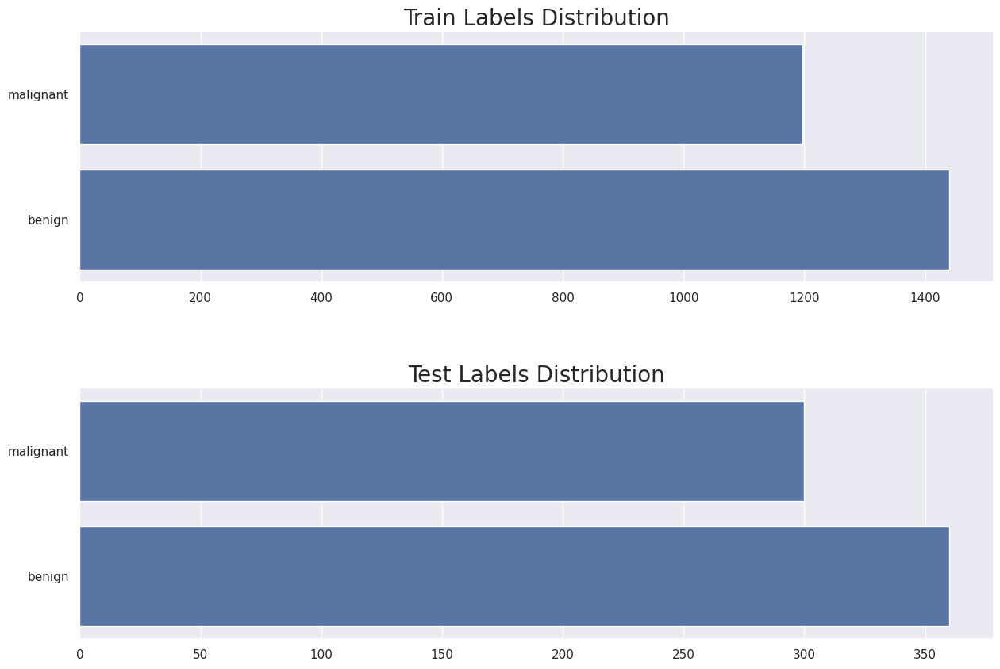

In [ ]:
# View Train Labels Distribution

fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot Train Labels Distribution
ax1.set_title('Train Labels Distribution', fontsize=20)
train_distribution = train_df['label'].value_counts().sort_values()
sns.barplot(x=train_distribution.values,
            y=list(train_distribution.keys()),
            orient="h",
            ax=ax1)

# Plot Test Labels Distribution
ax2.set_title('Test Labels Distribution', fontsize=20)
test_distribution = test_df['label'].value_counts().sort_values()
sns.barplot(x=test_distribution.values,
            y=list(test_distribution.keys()),
            orient="h",
            ax=ax2);

sns.despine();

Importantly, the Malignant and Benign classes are fairly balanced/evenly distributed, so the **ROC metric will be used to evaluate model performance**.

Moreover, roughly 20% of total Train dataset is present in Test dataset, which is important for validation purposes.

In [ ]:
# Save Notebook session so that data
# doesn't need to be downloaded again
# https://stackoverflow.com/questions/34342155/how-to-pickle-or-store-jupyter-ipython-notebook-session-for-later

dill.dump_session('notebook_env.db')
print(os.listdir())

['.config', 'data', 'skin-cancer-malignant-vs-benign.zip', 'drive', 'train', 'notebook_env.db', 'test', 'sample_data']


## Pre-processing for Computer Vision Tasks: Data Augmentation
*Source: [Hugging Face Computer Vision Course - Unit 1 - Pre-processing for Computer Vision Tasks](https://huggingface.co/learn/computer-vision-course/unit1/image_and_imaging/examples-preprocess)*

Data Augmentation "involves artificially expanding a training dataset by creating modified versions of datapoints, either through minor alterations or by generating new data using deep learning techniques." It "plays a crucial role in enhancing the performance and generalization of CNNs used in image classification." Importantly, it "enhances model accuracy, prevents overfitting, and reduces costs associated with data labelling and cleaning."

When applied to images, "image augmentation involves transformations like flipping, cropping, and applying kernel filters...these methods are instrumental in fields like healthcare for medical imaging." The following tools can implement image augmentation practices, "such as random rotations, brightness adjustments, shifts, flips, and zoom":
  * Pytorch
  * Augmentor
  * Albumentations
  * Imgaug
  * OpenCV


**So why is pre-processing through data augmentation necessary?** Because when CNNs "are applied to real-world problems, a gap in performance is frequently observed." In the context of image classification with CNNs, "data augmentation addresses this gap by multiplying the number of images in a dataset...without the need for additional data collection." The variability that is introduced to the dataset via data augmentation enhances the "robustness of the training process," making the model more invariant to changes in the data. Additionally, "implementing batch-wise augmentation during model training...also conserves disk space, as there's no need to store transformed images."

> "*Overall, data augmentation is not merely a method for dataset expansion: it’s a vital component in developing effective and practical CNN models for image classification tasks. By improving model performance and its ability to generalize from training data to real-world applications, data augmentation stands as a cornerstone technique in the field of deep learning, addressing the perpetual demand for more comprehensive and diverse data.*"



## Train & Validation Split with Training Set

In [ ]:
# Create Train/Val split with Training Set
train_split_idx, val_split_idx, _, _ = train_test_split(train_df.index,
                                                        train_df.label_encoded,
                                                        test_size=0.15,
                                                        stratify=train_df.label_encoded,
                                                        random_state=CFG_pt.SEED)

In [ ]:
# Get new training and validation data
train_new_df = train_df.iloc[train_split_idx].reset_index(drop=True)
val_df = train_df.iloc[val_split_idx].reset_index(drop=True)

# View shapes
train_new_df.shape, val_df.shape

((2241, 3), (396, 3))

In [ ]:
train_new_df.head(3)

,image_path,label,label_encoded
0,/content/train/benign/443.jpg,benign,1
1,/content/train/malignant/728.jpg,malignant,0
2,/content/train/malignant/235.jpg,malignant,0


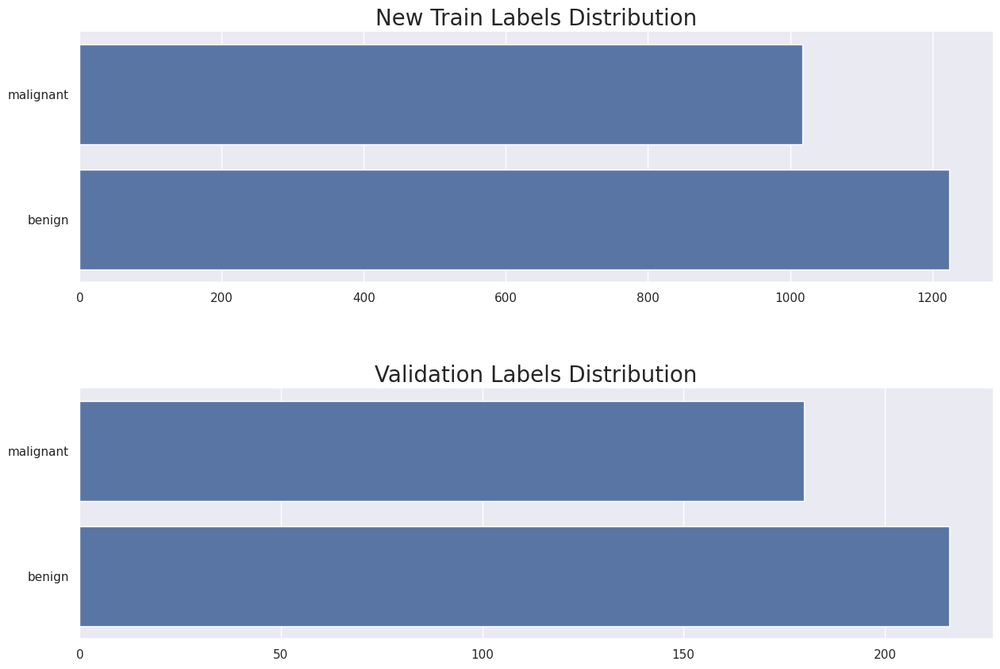

In [ ]:
# View New Train & Test Labels Distribution

fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot New Train Labels Distribution
ax1.set_title('New Train Labels Distribution', fontsize=20)
train_new_distribution = train_new_df['label'].value_counts().sort_values()
sns.barplot(x=train_new_distribution.values,
            y=list(train_new_distribution.keys()),
            orient="h",
            ax=ax1)

# Plot Validation Labels Distribution
ax2.set_title('Validation Labels Distribution', fontsize=20)
val_distribution = val_df['label'].value_counts().sort_values()
sns.barplot(x=val_distribution.values,
            y=list(val_distribution.keys()),
            orient="h",
            ax=ax2);

sns.despine();

In [ ]:
type(sample_image)

torch.Tensor

## Create an Image Data Augmentation Layer




*Note*: The [model code/Kaggle notebook](https://www.kaggle.com/code/matthewjansen/transfer-learning-skin-cancer-classification) I'm learning from and trying to replicate contains the TensorFlow transformation [RandomZoom](https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomZoom), which "randomly zooms images during training." PyTorch transformations does not have a direct equivalent of that transformation; the most similar PyTorch transformation appears to be [RandomResizedCrop](https://pytorch.org/vision/main/generated/torchvision.transforms.RandomResizedCrop.html) ("Crop a random portion of image and resize it to a given size").

I will include the  RandomResizedCrop transformation in my augmentation layer.

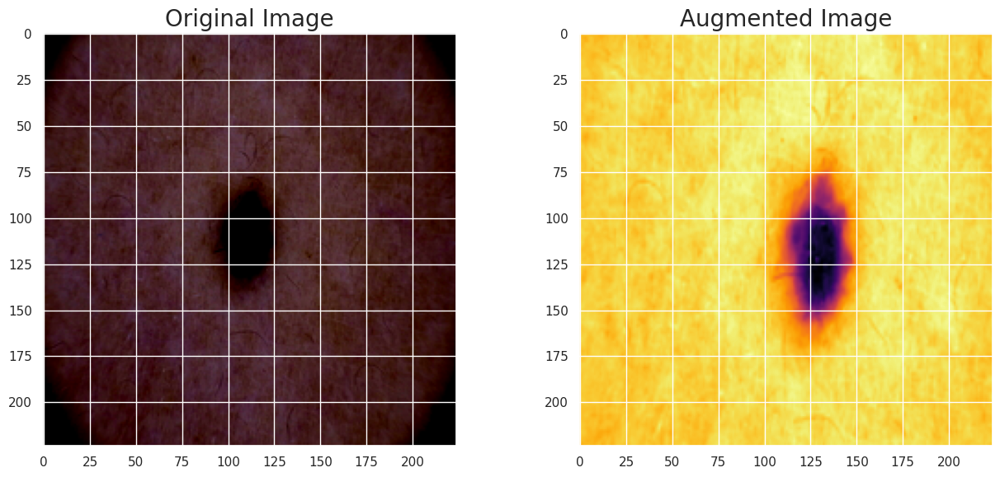

In [ ]:
# Now apply PyTorch augmentations

import torch
from torchvision.transforms import v2

# Define the augmentation layer
augmentation_layer = v2.Compose([
    v2.RandomVerticalFlip(p = 0.5),
    v2.RandomHorizontalFlip(p = 0.5),
    v2.RandomResizedCrop(size = (CFG_pt.HEIGHT, CFG_pt.WIDTH)),
    #v2.ToDtype(torch.float32, scale = True),
    #v2.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
])

type(sample_image)

# Define the transformation to convert RGB to Grayscale
to_grayscale = v2.Grayscale(num_output_channels = 1)

# Convert to grayscale
grayscale_image = to_grayscale(sample_image)

# Apply augmentations to the grayscale image
augmented_image = augmentation_layer(grayscale_image)

# Convert augmented image back to NumPy for visualization
augmented_image_np = np.array(augmented_image)

# Convert augmented image back to NumPy for visualization
sample_image_np = np.array(sample_image)

# Visualize Original and Augmented Image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(sample_image.permute(1, 2, 0), cmap = 'inferno')

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(augmented_image.permute(1, 2, 0), cmap = 'inferno')

plt.show();


I decided to remove RandomResizedCrop from my augmentation layer since it isn't an TensorFlow equivalent.

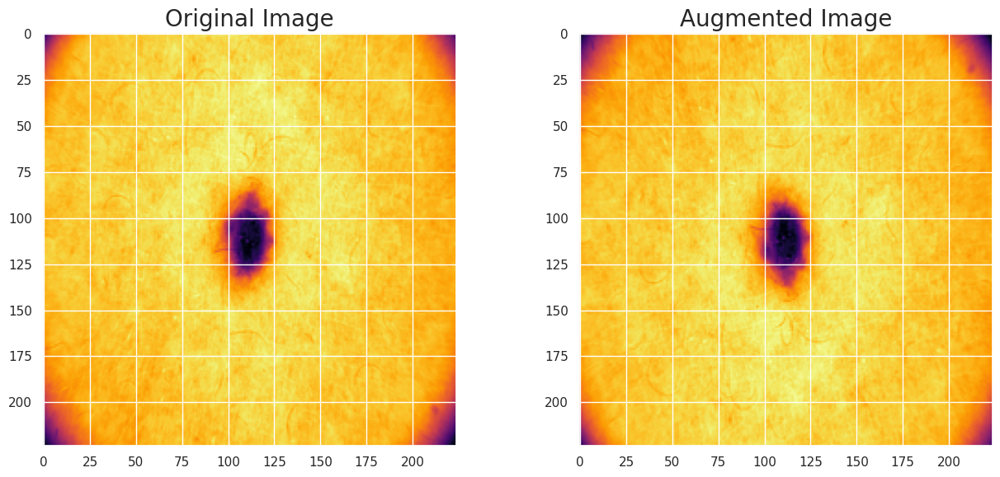

In [ ]:
# Now apply PyTorch augmentations
# **Removed RandomResizedCrop**
# Added ToTensor() to ensure torch tensor format

import torch
from torchvision.transforms import v2

# Define the augmentation layer
augmentation_layer = v2.Compose([
    v2.RandomVerticalFlip(p = 0.5),
    v2.RandomHorizontalFlip(p = 0.5),
    #v2.RandomResizedCrop(size = (CFG_pt.HEIGHT, CFG_pt.WIDTH)),
    #v2.ToDtype(torch.float32, scale = True),
    #v2.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
    v2.ToTensor(), # Converts uint8 image to float32 tensor
])

type(sample_image)

# Define the transformation to convert RGB to Grayscale
to_grayscale = v2.Grayscale(num_output_channels = 1)

# Convert to grayscale
grayscale_image = to_grayscale(sample_image)

# Apply augmentations to the grayscale image
augmented_image = augmentation_layer(grayscale_image)

# Visualize Original and Augmented Image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 10))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# View Original Image
ax1.set_title('Original Image', fontsize=20)
ax1.imshow(grayscale_image.permute(1, 2, 0), cmap = 'inferno')

# View Augmented Image
ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(augmented_image.permute(1, 2, 0), cmap = 'inferno')

plt.show();


### Confirm transformations in augmentation layer

In [ ]:
# Apply the augmentation layer to the training dataset
# (don't need to apply augmentation to validation dataset)
# https://www.kaggle.com/code/shtrausslearning/pytorch-cnn-binary-image-classification

train_new_df.transform = augmentation_layer
train_new_df.transform

Compose(
      RandomVerticalFlip(p=0.5)
      RandomHorizontalFlip(p=0.5)
      ToTensor()
)

*Should I apply an "empty" v2.Compose([]) to the val_df as a control and be consistent with A/B testing? (i.e., Be more confident that the transformations are due to the arguments within the v2.compose function and not just the v2.compose function itself?)*

I can add "empty" v2.Compose() to validation dataset, but it isn't necessary, as only two classes exist in this task.

If there were three classes (e.g., benign, malignant, "other"), then application of an empty v2.Compose() would make sense, but I have only two classes in this task

In [ ]:
# Save Notebook session so that data
# doesn't need to be downloaded again
# https://stackoverflow.com/questions/34342155/how-to-pickle-or-store-jupyter-ipython-notebook-session-for-later

dill.dump_session('notebook_env.db')
print(os.listdir())

['.config', 'data', 'skin-cancer-malignant-vs-benign.zip', 'drive', 'train', 'notebook_env.db', 'test', 'sample_data']


## Create Dataloaders
*Source: https://pytorch.org/tutorials/beginner/basics/data_tutorial.html*

> "While training a model, we typically want to pass samples in "minibatches," reshuffle the data at every epoch to reduce model overfitting, and use Python's multiprocesing to speed up data retrieval."

> "DataLoader is an iterable that abstracts this complexity for us in an easy API"


In [ ]:
# https://www.kaggle.com/code/shtrausslearning/pytorch-cnn-binary-image-classification

from torch.utils.data import DataLoader

# train_new_df DataLoader

train_dataloader = DataLoader(train_new_df, batch_size = CFG_pt.BATCH_SIZE, shuffle = True)

# val_df DataLoader

val_dataloader = DataLoader(val_df, batch_size = CFG_pt.BATCH_SIZE, shuffle = False)

### Need to convert Pandas DataFrame to PyTorch Tensor!

Feature batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])


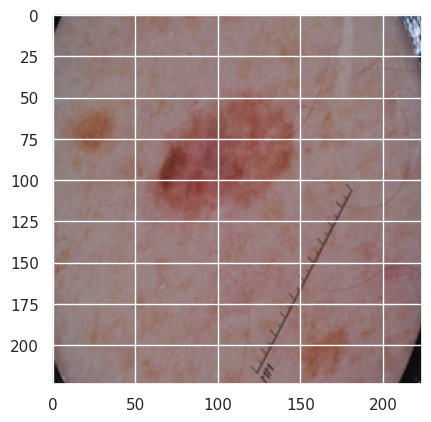

Malignant


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image

class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        """
        Custom Dataset class for handling Pandas DataFrames.

        Args:
            df (pd.DataFrame): The Pandas DataFrame containing the data.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Include the corresponding columns for 'image' and 'label' in PandasDataFrame
        image = read_image(self.df.iloc[idx]['image_path'])  # Access image data using iloc
        label = self.df.iloc[idx]['label_encoded']  # Access label data using iloc

        if self.transform:
            image = self.transform(image)

        # Ensure label is a tensor
        # long type for classification
        label = torch.tensor(label, dtype = torch.long)

        return image, label

# Create an instance of the custom dataset (Pandas DF --> PyTorch Tensor)
train_dataset = CustomDataset(train_new_df, transform = augmentation_layer)

# Create the DataLoader using the custom dataset
train_dataloader = DataLoader(train_dataset, batch_size=CFG_pt.BATCH_SIZE, shuffle = True)

# Display image and label
train_features, train_labels = next(iter(train_dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].squeeze()
img = img.permute(1,2, 0) # Change order of dimensions
label = train_labels[0]
CLA_label = {
    1 : 'Benign',
    0 : 'Malignant'
}
plt.imshow(img, cmap = "inferno")
plt.show()
print(CLA_label[label.item()])

Note the encoded label for each class:

* **Benign = 1**
* **Malignant = 0**

> label.item(): The item() method is used to get the Python scalar value from a PyTorch tensor that contains a single element. By using **label.item()**, *you extract the integer value from the tensor, which can then be used as a key to access the CLA_label dictionary correctly*.

Feature batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])


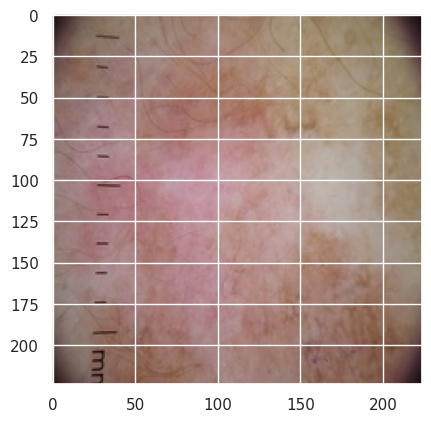

Malignant


In [ ]:
# Create an instance of the custom dataset for the validation dataset
# Converts Validation Pandas DataFrame to Validation Torch DataFrame

val_dataset = CustomDataset(val_df)

# Now, create the DataLoader using the custom validation dataset

val_dataloader = DataLoader(val_dataset, batch_size=CFG_pt.BATCH_SIZE, shuffle = True)

# Display image and label

val_features, val_labels = next(iter(val_dataloader))
print(f"Feature batch shape: {val_features.size()}")
print(f"Labels batch shape: {val_labels.size()}")
val_img = val_features[0].squeeze()
val_img = val_img.permute(1,2, 0) # Change order of dimensions
val_label = val_labels[0]
CLA_label = {
    1 : 'Benign',
    0 : 'Malignant'
}
plt.imshow(val_img, cmap = "inferno")
plt.show()
print(CLA_label[val_label.item()])

In [ ]:
# print shape for Training data and Validation data
# https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch

for key, value in {'Training data': train_dataloader, "Validation data": val_dataloader}.items():
    for X, y in value:
        print(f"{key}:")
        print(f"Shape of X : {X.shape}")
        print(f"Shape of y: {y.shape} {y.dtype}\n")
        break

Training data:
Shape of X : torch.Size([32, 3, 224, 224])
Shape of y: torch.Size([32]) torch.int64

Validation data:
Shape of X : torch.Size([32, 3, 224, 224])
Shape of y: torch.Size([32]) torch.int64



In [ ]:
# Save Notebook session so that data
# doesn't need to be downloaded again
# https://stackoverflow.com/questions/34342155/how-to-pickle-or-store-jupyter-ipython-notebook-session-for-later

dill.dump_session('notebook_env.db')
print(os.listdir())

['.config', 'data', 'skin-cancer-malignant-vs-benign.zip', 'train', 'notebook_env.db', 'test', 'sample_data']


## Overview of the CNN model development process from the notebook I'm trying to replicate
*Source: https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch*

1. Define Tumor Classifier
  * Define Loss Function
  * Define Optimiser
2. Train Model
  * Define parameters for training and evaluation of CNN model
3. Evaluate model (visualizations)
  * ROC curve
  * Confusion matrix

In [ ]:
'''This function can be useful in determining the output size of a convolutional layer in a neural network,
given the input dimensions and the convolutional layer's parameters.'''

def findConv2dOutShape(hin,win,conv,pool=2):
    # get conv arguments
    kernel_size = conv.kernel_size
    stride=conv.stride
    padding=conv.padding
    dilation=conv.dilation

    hout=np.floor((hin+2*padding[0]-dilation[0]*(kernel_size[0]-1)-1)/stride[0]+1)
    wout=np.floor((win+2*padding[1]-dilation[1]*(kernel_size[1]-1)-1)/stride[1]+1)

    if pool:
        hout/=pool
        wout/=pool
    return int(hout),int(wout)

(*Note*: This CNN_TUMOR produced the following error: RuntimeError: shape '[-1, 12544]' is invalid for input of size 294912. Including code in notebook for reference. More details on this error and subsequent troubleshooting efforts are discussed further below.)

In [ ]:
# Define Architecture For CNN_TUMOR Model
class CNN_TUMOR(nn.Module):

    # Network Initialisation
    def __init__(self, params):

        super(CNN_TUMOR, self).__init__()

        Cin,Hin,Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h,w=findConv2dOutShape(Hin,Win,self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2*init_f, kernel_size=3)
        h,w=findConv2dOutShape(h,w,self.conv2)
        self.conv3 = nn.Conv2d(2*init_f, 4*init_f, kernel_size=3)
        h,w=findConv2dOutShape(h,w,self.conv3)
        self.conv4 = nn.Conv2d(4*init_f, 8*init_f, kernel_size=3)
        h,w=findConv2dOutShape(h,w,self.conv4)

        # compute the flatten size
        self.num_flatten=h*w*8*init_f
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self,X):

        # Convolution & Pool Layers
        X = F.relu(self.conv1(X));
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, self.num_flatten)
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)
        return F.log_softmax(X, dim=1)

In [ ]:
params_model={
        "shape_in": (3,256,256),
        "initial_filters": 8,
        "num_fc1": 100,
        "dropout_rate": 0.25,
        "num_classes": 2}

# Create instantiation of Network class
cnn_model = CNN_TUMOR(params_model)

# define computation hardware approach (GPU/CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = cnn_model.to(device)

In [ ]:
#! pip install torch-summary
from torchsummary import summary

# Model Summary for CNN Model
summary(cnn_model, input_size=(3, 256, 256),device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 254, 254]             224
            Conv2d-2         [-1, 16, 125, 125]           1,168
            Conv2d-3           [-1, 32, 60, 60]           4,640
            Conv2d-4           [-1, 64, 28, 28]          18,496
            Linear-5                  [-1, 100]       1,254,500
            Linear-6                    [-1, 2]             202
Total params: 1,279,230
Trainable params: 1,279,230
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 7.11
Params size (MB): 4.88
Estimated Total Size (MB): 12.74
----------------------------------------------------------------


In [ ]:
# Define Loss Function

loss_func = nn.NLLLoss(reduction="sum")

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Define Optimiser

opt = optim.Adam(cnn_model.parameters(), lr = 3e-4)
lr_scheduler = ReduceLROnPlateau(opt, mode = 'min', factor = 0.5, patience = 20, verbose = 1)

### Training Model

In [ ]:
# Function to get the learning rate
def get_lr(opt):
    for param_group in opt.param_groups:
        return param_group['lr']

# Function to compute the loss value per batch of data
def loss_batch(loss_func, output, target, opt=None):

    loss = loss_func(output, target) # get loss
    pred = output.argmax(dim=1, keepdim=True) # Get Output Class
    metric_b=pred.eq(target.view_as(pred)).sum().item() # get performance metric

    if opt is not None:
        opt.zero_grad()
        loss.backward()
        opt.step()

    return loss.item(), metric_b

# Compute the loss value & performance metric for the entire dataset (epoch)
def loss_epoch(model,loss_func,dataset_dl,opt=None):

    run_loss=0.0
    t_metric=0.0
    len_data=len(dataset_dl.dataset)

    # internal loop over dataset
    for xb, yb in dataset_dl:
        # move batch to device
        xb=xb.to(device)
        yb=yb.to(device)
        output=model(xb) # get model output
        loss_b,metric_b=loss_batch(loss_func, output, yb, opt) # get loss per batch
        run_loss+=loss_b        # update running loss

        if metric_b is not None: # update running metric
            t_metric+=metric_b

    loss=run_loss/float(len_data)  # average loss value
    metric=t_metric/float(len_data) # average metric value

    return loss, metric


### Training Function

In [ ]:
def Train_Val(model, params,verbose=False):

    # Get the parameters
    epochs=params["epochs"]
    loss_func=params["f_loss"]
    opt=params["optimiser"]
    train_dataloader=params["train"]
    val_dataloader=params["val"]
    lr_scheduler=params["lr_change"]
    weight_path=params["weight_path"]

    # history of loss values in each epoch
    loss_history={"train": [],"val": []}
    # histroy of metric values in each epoch
    metric_history={"train": [],"val": []}
    # a deep copy of weights for the best performing model
    best_model_wts = copy.deepcopy(model.state_dict())
    # initialize best loss to a large value
    best_loss=float('inf')

# Train Model n_epochs (the progress of training by printing the epoch number and the associated learning rate. It can be helpful for debugging, monitoring the learning rate schedule, or gaining insights into the training process.)

    for epoch in tqdm(range(epochs)):

        # Get the Learning Rate
        current_lr=get_lr(opt)
        if(verbose):
            print('Epoch {}/{}, current lr={}'.format(epoch, epochs - 1, current_lr))


# Train Model Process


        model.train()
        train_loss, train_metric = loss_epoch(model,loss_func,train_dataloader,opt)

        # collect losses
        loss_history["train"].append(train_loss)
        metric_history["train"].append(train_metric)


# Evaluate Model Process


        model.eval()
        with torch.no_grad():
            val_loss, val_metric = loss_epoch(model,loss_func,val_dataloader)

        # store best model
        if(val_loss < best_loss):
            best_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())

            # store weights into a local file
            torch.save(model.state_dict(), weight_path)
            if(verbose):
                print("Copied best model weights!")

        # collect loss and metric for validation dataset
        loss_history["val"].append(val_loss)
        metric_history["val"].append(val_metric)

        # learning rate schedule
        lr_scheduler.step(val_loss)
        if current_lr != get_lr(opt):
            if(verbose):
                print("Loading best model weights!")
            model.load_state_dict(best_model_wts)

        if(verbose):
            print(f"train loss: {train_loss:.6f}, dev loss: {val_loss:.6f}, accuracy: {100*val_metric:.2f}")
            print("-"*10)

    # load best model weights
    model.load_state_dict(best_model_wts)

    return model, loss_history, metric_history

In [ ]:
# Function to compute the loss value & performance metric for the entire dataset (epoch)
def loss_epoch(model,loss_func,dataset_dl,opt=None):

    run_loss=0.0
    t_metric=0.0
    len_data=len(dataset_dl.dataset)

    # internal loop over dataset
    for xb, yb in dataset_dl:
        # move batch to device
        xb=xb.to(device).type(torch.float32) # Convert input data to float32
        yb=yb.to(device)
        output=model(xb) # get model output
        loss_b,metric_b=loss_batch(loss_func, output, yb, opt) # get loss per batch
        run_loss+=loss_b        # update running loss

        if metric_b is not None: # update running metric
            t_metric+=metric_b

    loss=run_loss/float(len_data)  # average loss value
    metric=t_metric/float(len_data) # average metric value

    return loss, metric

### Training Process

In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)


  0%|          | 0/60 [00:00<?, ?it/s]

RuntimeError: shape '[-1, 12544]' is invalid for input of size 294912

From ChatGPT:
> "The error you encountered (RuntimeError: shape '[-1, 12544]' is invalid for input of size 294912) typically happens when there is a mismatch between the flattened tensor size in your forward() method and the actual size of the input after passing through the convolutional and pooling layers."

#### A **LOT** of troubleshooting and debugging

I had hoped to apply [the code for a CNN tumor detection model from this excellent Kaggle notebook](https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch) to my Torch dataframe, but I quickly learned that there were several factors that prohibited this code from running successfully on my dataset.

In [ ]:
def findConv2dOutShape(hin, win, conv, pool=2):
    # get conv arguments
    kernel_size = conv.kernel_size
    stride = conv.stride
    padding = conv.padding
    dilation = conv.dilation

    hout = np.floor((hin + 2 * padding[0] - dilation[0] * (kernel_size[0] - 1) - 1) / stride[0] + 1)
    wout = np.floor((win + 2 * padding[1] - dilation[1] * (kernel_size[1] - 1) - 1) / stride[1] + 1)

    if pool:
        hout /= pool
        wout /= pool
    return int(hout), int(wout)

class CNN_TUMOR(nn.Module):
    # Network Initialisation
    def __init__(self, params):
        super(CNN_TUMOR, self).__init__()

        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        print(f"Flattened size: {self.num_flatten}")  # Debugging output
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        # Convolution & Pool Layers
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv1: {X.shape}")  # Debugging output

        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv2: {X.shape}")  # Debugging output

        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv3: {X.shape}")  # Debugging output

        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv4: {X.shape}")  # Debugging output

        X = X.view(-1, self.num_flatten)
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)
        return F.log_softmax(X, dim=1)


In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)


In [ ]:
class CNN_TUMOR(nn.Module):
    # Network Initialisation
    def __init__(self, params, device):
        super(CNN_TUMOR, self).__init__()

        self.device = device  # Set the device attribute

        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        print(f"Flattened size: {self.num_flatten}")  # Debugging output
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        # Move input X to the correct device
        X = X.to(self.device)

        # Convolution & Pool Layers
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv1: {X.shape}")  # Debugging output

        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv2: {X.shape}")  # Debugging output

        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv3: {X.shape}")  # Debugging output

        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv4: {X.shape}")  # Debugging output

        X = X.view(-1, self.num_flatten)
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)
        return F.log_softmax(X, dim=1)


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
params_model = {
    "shape_in": (3, 256, 256),
    "initial_filters": 8,
    "num_fc1": 100,
    "dropout_rate": 0.25,
    "num_classes": 2
}

# Pass the device as an argument to the model
cnn_model = CNN_TUMOR(params_model, device).to(device)

In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)


In [ ]:
class CNN_TUMOR(nn.Module):
    # Network Initialisation
    def __init__(self, params, device):
        super(CNN_TUMOR, self).__init__()

        self.device = device  # Set the device attribute

        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        print(f"Flattened size: {self.num_flatten}")  # Debugging output
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv1: {X.shape}")  # Debugging output

        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv2: {X.shape}")  # Debugging output

        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv3: {X.shape}")  # Debugging output

        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv4: {X.shape}")  # Debugging output

        # Dynamically calculate the flattened size
        X = X.view(X.size(0), -1)  # Flatten the tensor dynamically
        print(f"Flattened shape: {X.shape}")

        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)

        return F.log_softmax(X, dim=1)


In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)

In [ ]:
class CNN_TUMOR(nn.Module):
    # Network Initialisation
    def __init__(self, params, device):
        super(CNN_TUMOR, self).__init__()

        self.device = device  # Set the device attribute

        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        print(f"Flattened size: {self.num_flatten}")  # Debugging output
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        # Move input X to the correct device
        X = X.to(self.device)

        # Convolution & Pooling Layers
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv1: {X.shape}")  # Debugging output

        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv2: {X.shape}")  # Debugging output

        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv3: {X.shape}")  # Debugging output

        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv4: {X.shape}")  # Debugging output

        # Dynamically flatten the tensor
        X = X.view(X.size(0), -1)  # Flatten the tensor while keeping the batch size
        print(f"Flattened shape: {X.shape}")

        # Fully connected layers
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)

        return F.log_softmax(X, dim=1)


In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN_TUMOR(nn.Module):
    def __init__(self, params, device):
        super(CNN_TUMOR, self).__init__()

        self.device = device  # Set the device attribute

        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        print(f"Flattened size: {self.num_flatten}")  # Debugging output
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        # Convolution & Pooling Layers
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv1: {X.shape}")  # Debugging output

        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv2: {X.shape}")  # Debugging output

        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv3: {X.shape}")  # Debugging output

        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        print(f"After conv4: {X.shape}")  # Debugging output

        # Dynamically flatten the tensor
        X = X.view(X.size(0), -1)  # Flatten while keeping the batch size
        print(f"Flattened shape: {X.shape}")

        # Fully connected layers
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)

        return F.log_softmax(X, dim=1)


In [ ]:
# Define various parameters used for training and evaluation of a cnn_model

params_train={
 "train": train_dataloader,"val": val_dataloader,
 "epochs": 60,
 "optimiser": optim.Adam(cnn_model.parameters(),lr=3e-4),
 "lr_change": ReduceLROnPlateau(opt,
                                mode='min',
                                factor=0.5,
                                patience=20,
                                verbose=0),
 "f_loss": nn.NLLLoss(reduction="sum"),
 "weight_path": "weights.pt",
}

# train and validate the model
cnn_model,loss_hist,metric_hist = Train_Val(cnn_model,params_train)

## CNN model

I decided to take several steps back and start over by

1. Ensuring that the Pandas DataFrame was successfully converted to a Torch DataFrame and that the images and labels in the Torch DataFrame were indeed Torch tensors
2. Then, after confirming that the augmentation layer included v2.ToTensor() as the final transformation, created the DataLoader using the Training Torch DataFrame
  * Note that the augmentation layer was not applied to the Validation Torch DataFrame
  * The Validation Pandas DataFrame was converted to a Validation Torch DataFrame in earlier code above
  * *An "empty" augmentation layer was not applied to the Validation Torch DataFrame because this image classification task has only two classes
    * Industry best practices require the application of an "empty" augmentation layer to the Validation DataFrame if there are more than two classes (e.g., "benign," "malignant," and "other")
    * Application of an empty augmentation layer to the Validation DataFrame isn't A/B testing or necessary here because each image is one of two classes
3. Finally, an image and its corresponding class/label were printed to verify a batch

After confirming that the pipeline was established successfully, I could define and instantiate the CNN model. [The model code](https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch) was simplified and altered to be suitable for the images in these Training and Validation Torch DataFrames.
* The first major difference between the code below and the model code is in the parameters of the model (params_model) where "shape_in" was upated from (3, 256, 256) to match the shape input of the dataset
  * This detail caused a lot of issues and headaches (see Troubleshooting efforts above)
* The *functions to get the learning rate, compute the loss value, and get performance metric* are not included in the code below
  * They are included in cells above and were already ran/established
* Train_Val definition code is also included above and was ran/established previously (not included in the code below)
  * loss_history and metric_history are included in this the Train_Val cell of code
* "lr_change": verbose = 1 in this code whereas verbose = 0 in the model code
  * lr_change: learning rate scheduler; adjusts the learning rate during training to improve model performance; helps model to converge faster and avoid getting stuck in local minima
  * verbose argument: controls whether the learning rate change is logged (i.e., printed) to the console
    * verbose = 1 means it will print out messages each time the learning rate is reduced (enables monitoring the behavior of the learning rate scheduler during training)
    * verbose = 0 means no messages will be displayed/logged

In [ ]:
# Define CNN Model for tumor classification
class CNN_TUMOR(nn.Module):
    def __init__(self, params):
        super(CNN_TUMOR, self).__init__()
        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = findConv2dOutShape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = findConv2dOutShape(h, w, self.conv4)

        # compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, self.num_flatten)
        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)
        return F.log_softmax(X, dim=1)

# Initialize the model
params_model = {
    "shape_in": (3, 224, 224),  # Update the input size to match your dataset's shape (224x224)
    "initial_filters": 8,
    "num_fc1": 100,
    "dropout_rate": 0.25,
    "num_classes": 2
}

# Instantiate the model
cnn_model = CNN_TUMOR(params_model)

# Define computation hardware approach (GPU/CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = cnn_model.to(device)

# Define Loss Function and Optimizer
loss_func = nn.NLLLoss(reduction = "sum")
opt = optim.Adam(cnn_model.parameters(), lr = 3e-4)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt,
                                                    mode = 'min',
                                                    factor = 0.5,
                                                    patience = 20,
                                                    verbose = 1)

# Train and Evaluate Model
params_train = {
    "train": train_dataloader,
    "val": val_dataloader,
    "epochs": 60,
    "optimiser": opt,
    "lr_change": lr_scheduler,
    "f_loss": loss_func,
    "weight_path": "weights.pt",
}

cnn_model, loss_hist, metric_hist = Train_Val(cnn_model, params_train)

  0%|          | 0/60 [00:00<?, ?it/s]

In [ ]:
# CNN model summary

summary(cnn_model, input_size=(3, 224, 224), device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 222, 222]             224
            Conv2d-2         [-1, 16, 109, 109]           1,168
            Conv2d-3           [-1, 32, 52, 52]           4,640
            Conv2d-4           [-1, 64, 24, 24]          18,496
            Linear-5                  [-1, 100]         921,700
            Linear-6                    [-1, 2]             202
Total params: 946,430
Trainable params: 946,430
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 5.40
Params size (MB): 3.61
Estimated Total Size (MB): 9.59
----------------------------------------------------------------


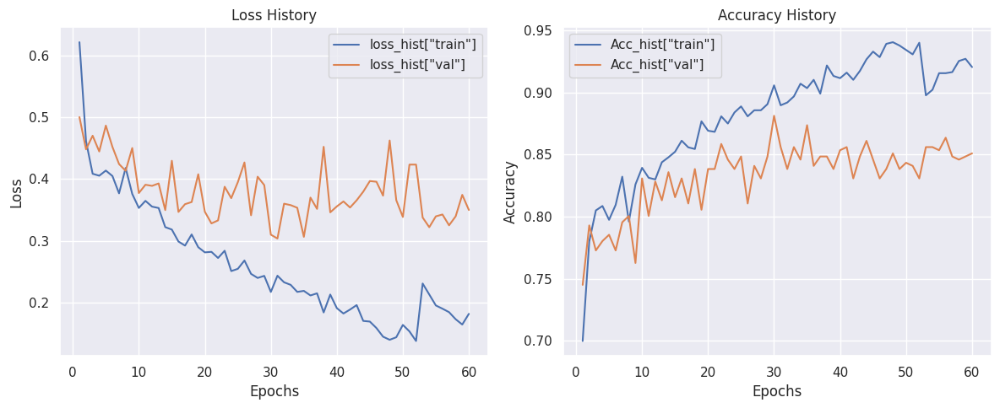

In [ ]:
# Convergence History Plot
epochs=params_train["epochs"]
fig,ax = plt.subplots(1,2,figsize=(12,5))

# Loss History Plot
sns.lineplot(x=[*range(1,epochs+1)],y=loss_hist["train"],ax=ax[0],label='loss_hist["train"]')
sns.lineplot(x=[*range(1,epochs+1)],y=loss_hist["val"],ax=ax[0],label='loss_hist["val"]')

ax[0].set_title('Loss History')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

# Accuracy History Plot
sns.lineplot(x=[*range(1,epochs+1)],y=metric_hist["train"],ax=ax[1],label='Acc_hist["train"]')
sns.lineplot(x=[*range(1,epochs+1)],y=metric_hist["val"],ax=ax[1],label='Acc_hist["val"]')

ax[1].set_title('Accuracy History')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')

# Legends for each plot
ax[0].legend()
ax[1].legend()

plt.tight_layout()
plt.show()

### Loss History and Accuracy History

These graphs provide an overview of how the model is learning and if the model is generalizable.

The model is converging, which is indicated by the improvements in performance over epochs.

**Loss History**

Both Training and Validation show a general decreasing trend, which indicates that the model is improving its performance on the training set as epochs increase. However, the difference between the Training and Validation lines between 30 - 40 epochs indicate the model may be overfitting, as Training continues to decrease while Validation fluctuates around 0.3 Loss. This gap between Training and Validation in the later stages of training suggests that the model is no longer learning and generalizing well to new data.

**Accuracy History**

Both training and validation trends show an increase in the accuracy of the model on the data over time. However, the Validation accuracy is lower than the Training accuracy; this suggests the model may be overfitting to the Training data.

**Potential strategies to address overfitting of CNN model**

* Use a different regularization technique
* Increasing the training data
  * Adding new samples
  * Increasing via additional transformations/data augmentation techniques
* Reducing number of epochs/Early Stopping

### Classification Report CNN model

Feature batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])


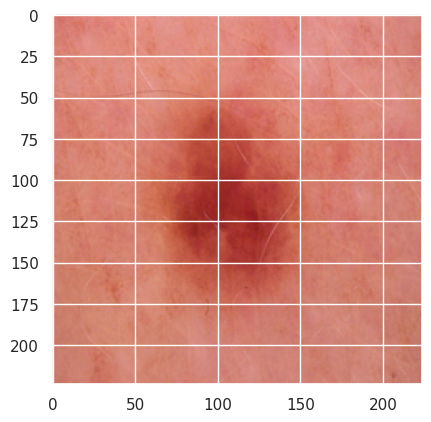

Benign


In [ ]:
# Verify a validation training batch

val_features, val_labels = next(iter(val_dataloader))
print(f"Feature batch shape: {val_features.size()}")
print(f"Labels batch shape: {val_labels.size()}")
img = val_features[0].squeeze()
img = img.permute(1, 2, 0)  # Change order of dimensions
label = val_labels[0]
CLA_label = {1: 'Benign', 0: 'Malignant'}
plt.imshow(img, cmap="inferno")
plt.show()
print(CLA_label[label.item()])

In [ ]:
# Define function For Classification Report
# Updated code based on code in
# https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch

def Ture_and_Pred(val_dataloader, model):
    i = 0
    y_true = []
    y_pred = []
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
      for images, labels in val_dataloader:
        images = images.to(device).float() # Convert uint images to float
        labels = labels.numpy()
        outputs = model(images)
        _, pred = torch.max(outputs.data, 1)
        pred = pred.detach().cpu().numpy()

        y_true = np.append(y_true, labels)
        y_pred = np.append(y_pred, pred)

    return y_true, y_pred


# check confusion matrix for error analysis
y_true, y_pred = Ture_and_Pred(val_dataloader, cnn_model)

print(classification_report(y_true, y_pred), '\n\n')
cm = confusion_matrix(y_true, y_pred)

              precision    recall  f1-score   support

         0.0       0.85      0.82      0.83       180
         1.0       0.85      0.88      0.87       216

    accuracy                           0.85       396
   macro avg       0.85      0.85      0.85       396
weighted avg       0.85      0.85      0.85       396
 




**Accuracy**: The rate of correct classification.

**Precision**: The proportion of positive predictions that are correct.

**Recall**: The proportion of instances in the positive class that were correctly predicted; this is a good indication of how many instances are being missed.
* 0.24 = only 24% of true positives were classified as positive and 76% of the true positives were classified as false negatives

**F-score**: The harmonized combination of Precision and Recall.

If I wanted to optimize this particular model, I would favor optimizations that increased Recall. Increasing Recall reduces false negatives, which is particularly important in this task. *Reducing false negatives in this task means less malignant tumors are misclassified as benign and more malignant tumors are correctly classified as malignant.* All performance metrics are <90%, so I'll try different models and see which performs best. I will treat this CNN model as my baseline model.

### Confusion Matrix for CNN model

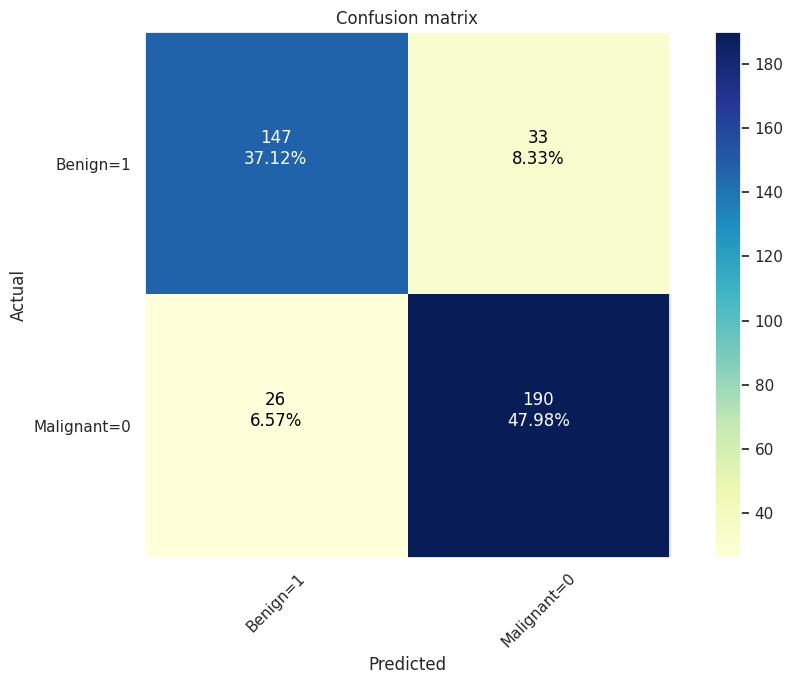

In [ ]:
# Confusion Matrix Plotting Function

def show_confusion_matrix(cm, CLA_label, title='Confusion matrix', cmap=plt.cm.YlGnBu):

    plt.figure(figsize=(10,7))
    plt.grid(False)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(CLA_label))

    plt.xticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()], rotation=45)
    plt.yticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()])

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i,j]}\n{cm[i,j]/np.sum(cm)*100:.2f}%", horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

show_confusion_matrix(cm, CLA_label)

**True Positives (TP)**: 152 of benign tumors were correctly predicted as benign.

**False Positives (FP)**: However, 28 benign tumors were incorrectly predicted as malignant.

**False Negatives (FN)**: 24 of malignant tumors were incorrectly predicted as benign.
* This is particularly concerning because this metric indicates that the number of cases where the CNN model failed to identify malignant tumors correctly

**True Negatives (TN)**: 192 of malignant tumors were correctly predicted as malignant.
* This indicates the model's ability to correctly identify malignant tumors

### ROC plot for CNN model

#### Need to convert the input tensors to float!

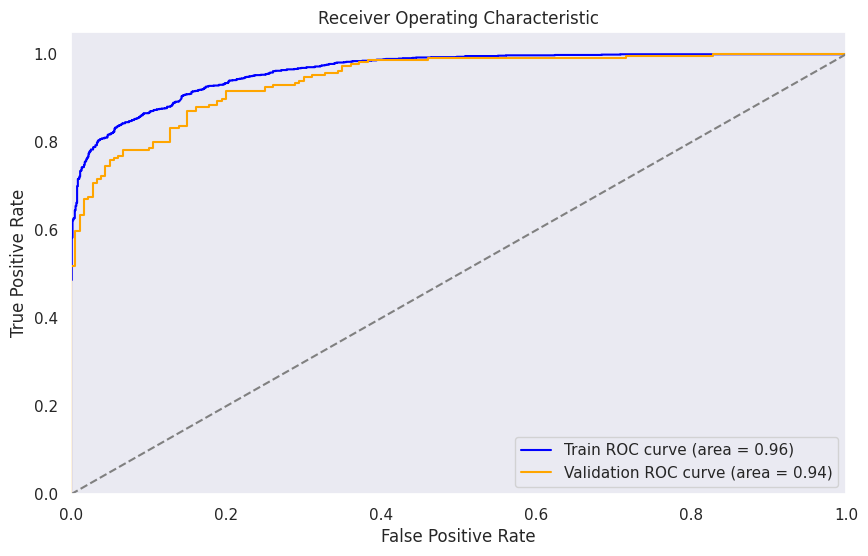

In [ ]:
# Get predictions and true labels function
def get_predictions_and_labels(dataloader, model):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for data in dataloader:
            inputs, labels = data
            inputs = inputs.to(device).float()  # Move inputs to device and convert to float
            labels = labels.to(device)  # Move labels to the same device
            outputs = model(inputs)  # Get model outputs
            probabilities = torch.softmax(outputs, dim=1)[:, 1]  # Apply softmax and get the class probability for class 1
            all_preds.append(probabilities.cpu().numpy())  # Move to CPU and convert to numpy
            all_labels.append(labels.cpu().numpy())  # Move to CPU and convert to numpy

    return np.concatenate(all_preds), np.concatenate(all_labels)

# Get predictions and true labels
train_preds, train_labels = get_predictions_and_labels(train_dataloader, model)
val_preds, val_labels = get_predictions_and_labels(val_dataloader, model)

# Compute ROC curve and AUC for training data
train_fpr, train_tpr, _ = roc_curve(train_labels, train_preds)
train_auc = auc(train_fpr, train_tpr)

# Compute ROC curve and AUC for validation data
val_fpr, val_tpr, _ = roc_curve(val_labels, val_preds)
val_auc = auc(val_fpr, val_tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(train_fpr, train_tpr, color='blue', label=f'Train ROC curve (area = {train_auc:.2f})')
plt.plot(val_fpr, val_tpr, color='orange', label=f'Validation ROC curve (area = {val_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.grid()
plt.show()


Because this is a binary classification task and the classes are relatively balanced, the ROC curve is an appropriate performance evaluation metric.

The ROC curves are in the ideal spot (i.e., the top left corner). A steep curve in this spot indicates minimization of the FP rate and maximization of the TP rate. Recall that the dashed line indicates a 50% chance classifier, which is similar to a coin toss or random classifier.

### Save CNN Model

In [ ]:
torch.save(cnn_model, "CNN_Tumor_model.pt")

##ResNet Model (Transfer Learning)

*Source: https://huggingface.co/learn/computer-vision-course/unit2/cnns/resnet*

> "ResNet's building blocks, designed as identity functions, preserve input information while enabling learning. This approach ensures efficient weight optimization and prevents degradation as the network becomes deeper"
> ResNet Network &rarr; Plain Network + Shortcuts!

Note that this ResNet model has been pre-trained on ImageNet.

In [ ]:
# ResNet imports
from transformers import AutoFeatureExtractor, ResNetForImageClassification

# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Set the model to evaluation mode
model.eval()

# Move the model to the appropriate device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define Loss Function, Optimizer, and Learning Rate Scheduler (from CNN model above)
loss_func = nn.NLLLoss(reduction="sum")
opt = optim.Adam(model.parameters(), lr=3e-4)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=20, verbose=1)

# Training parameters
num_epochs = 60  # Number of training epochs

# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)
        loss = loss_func(outputs.logits, labels)

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using define optimizer
        opt.zero_grad()  # Clear gradients for the next step

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    total = 0
    val_loss = 0

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Get predicted labels
            predicted_labels = logits.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

     # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)
    val_accuracy /= total

    # Print validation metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Update the learning rate based on validation loss
    lr_scheduler.step(val_loss)

preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Epoch 1/60, Validation Loss: 0.0000, Validation Accuracy: 0.6894
Epoch 2/60, Validation Loss: 0.0000, Validation Accuracy: 0.4444
Epoch 3/60, Validation Loss: 0.0000, Validation Accuracy: 0.3662
Epoch 4/60, Validation Loss: 0.0000, Validation Accuracy: 0.4697


KeyboardInterrupt: 

### Constant Validation Loss-- Fix it!

All epochs show a constant Validation Loss of 0, which indicates an issue with the loss calculation and loss function; typically, the validation loss should fluctuate as the model learns. The constant Validation Loss of zero suggests that the model isn't learning and/or possibly overfitting to the training data.

In [ ]:
# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Set the model to evaluation mode
model.eval()

# Move the model to the appropriate device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define Loss Function, Optimizer, and Learning Rate Scheduler
loss_func = nn.NLLLoss(reduction="sum")
opt = optim.Adam(model.parameters(), lr=3e-4)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=20, verbose=1)

# Training parameters
num_epochs = 60  # Number of training epochs

# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)
        loss = loss_func(outputs.logits, labels)

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using defined optimizer
        opt.zero_grad()  # Clear gradients for the next step

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    total = 0
    val_loss = 0  # Initialize validation loss

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Calculate validation loss
            val_loss += loss_func(logits, labels).item()  # Accumulate validation loss

            # Get predicted labels
            predicted_labels = logits.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

    # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)  # Calculate the mean validation loss
    val_accuracy /= total  # Calculate the mean validation accuracy

    # Print validation metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Update the learning rate based on validation loss
    lr_scheduler.step(val_loss)


Epoch 1/60, Validation Loss: -3449.2809, Validation Accuracy: 0.7475
Epoch 2/60, Validation Loss: -11462.7193, Validation Accuracy: 0.6439
Epoch 3/60, Validation Loss: -4755.0363, Validation Accuracy: 0.3687
Epoch 4/60, Validation Loss: -7979.1461, Validation Accuracy: 0.4520
Epoch 5/60, Validation Loss: -12259.1820, Validation Accuracy: 0.4722
Epoch 6/60, Validation Loss: -16157.2643, Validation Accuracy: 0.5783
Epoch 7/60, Validation Loss: -14686.1858, Validation Accuracy: 0.5303
Epoch 8/60, Validation Loss: -12586.2982, Validation Accuracy: 0.4495
Epoch 9/60, Validation Loss: -18508.3470, Validation Accuracy: 0.5328
Epoch 10/60, Validation Loss: -12402.5388, Validation Accuracy: 0.3611
Epoch 11/60, Validation Loss: -28759.6423, Validation Accuracy: 0.6843
Epoch 12/60, Validation Loss: -20531.5675, Validation Accuracy: 0.5631
Epoch 13/60, Validation Loss: -32334.1575, Validation Accuracy: 0.5833
Epoch 14/60, Validation Loss: -26955.6227, Validation Accuracy: 0.5707
Epoch 15/60, Valid

### Negative Validation Loss -- Fix it!

NLLLoss (Negative Log Likelihood Loss) output negative values if the inputs or targets are not in the expected format. If NLLLoss is used, the input to the loss function must be log probabilities, not raw logits &rarr; *apply a log softmax to the outputs before passing them to NLLLoss*

```
log_probs = nn.functional.log_softmax(outputs.logits, dim = 1)
```
This needs to be applied
* 1) In the Training phase: After obtaining the model outputs to transform logits into log probabilities suitable for NLLLoss
* 2) In the Validation phase: Before calculating the validation loss

In [ ]:
from transformers import AutoFeatureExtractor, ResNetForImageClassification

# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Move the model to the appropriate device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define Loss Function, Optimizer, and Learning Rate Scheduler
loss_func = nn.NLLLoss(reduction="sum")
opt = optim.Adam(model.parameters(), lr=3e-4)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.5, patience=20, verbose=1)

# Training parameters
num_epochs = 60  # Number of training epochs

# Lists to store loss and accuracy history
train_loss_hist = []
val_loss_hist = []
train_acc_hist = []
val_acc_hist = []

# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    train_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)

        # Apply LogSoftmax to outputs for NLLLoss
        log_probs = nn.functional.log_softmax(outputs.logits, dim=1)

        # Calculate loss
        loss = loss_func(log_probs, labels)
        train_loss += loss.item()  # Accumulate training loss

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using defined optimizer
        opt.zero_grad()  # Clear gradients for the next step

        # Get predicted labels
        predicted_labels = log_probs.argmax(-1)
        correct += (predicted_labels == labels).sum().item()
        total += labels.size(0)

    # Calculate average training loss and accuracy
    train_loss /= len(train_dataloader)
    train_acc = correct / total
    train_loss_hist.append(train_loss)
    train_acc_hist.append(train_acc)

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    val_loss = 0  # Initialize validation loss
    total = 0

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Apply LogSoftmax to logits for NLLLoss
            log_probs = nn.functional.log_softmax(logits, dim=1)

            # Calculate validation loss
            val_loss += loss_func(log_probs, labels).item()  # Accumulate validation loss

            # Get predicted labels
            predicted_labels = log_probs.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

    # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)  # Calculate the mean validation loss
    val_accuracy /= total  # Calculate the mean validation accuracy

    # Store validation loss and accuracy
    val_loss_hist.append(val_loss)
    val_acc_hist.append(val_accuracy)

    # Print validation metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Update the learning rate based on validation loss
    lr_scheduler.step(val_loss)

preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Epoch 1/60, Training Loss: 98.5986, Training Accuracy: 0.5065, Validation Loss: 18.6366, Validation Accuracy: 0.8384
Epoch 2/60, Training Loss: 15.5702, Training Accuracy: 0.8331, Validation Loss: 11.1105, Validation Accuracy: 0.8561
Epoch 3/60, Training Loss: 10.3076, Training Accuracy: 0.8648, Validation Loss: 9.7399, Validation Accuracy: 0.8434
Epoch 4/60, Training Loss: 8.3810, Training Accuracy: 0.8853, Validation Loss: 9.5412, Validation Accuracy: 0.8586
Epoch 5/60, Training Loss: 7.2121, Training Accuracy: 0.9067, Validation Loss: 9.1647, Validation Accuracy: 0.8687
Epoch 6/60, Training Loss: 6.5859, Training Accuracy: 0.9206, Validation Loss: 8.6451, Validation Accuracy: 0.8889
Epoch 7/60, Training Loss: 5.9525, Training Accuracy: 0.9282, Validation Loss: 8.0508, Validation Accuracy: 0.8889
Epoch 8/60, Training Loss: 4.3581, Training Accuracy: 0.9447, Validation Loss: 9.2094, Validation Accuracy: 0.8813
Epoch 9/60, Training Loss: 4.1966, Training Accuracy: 0.9527, Validation Lo

### Loss and Accuracy History Plots for ResNet model

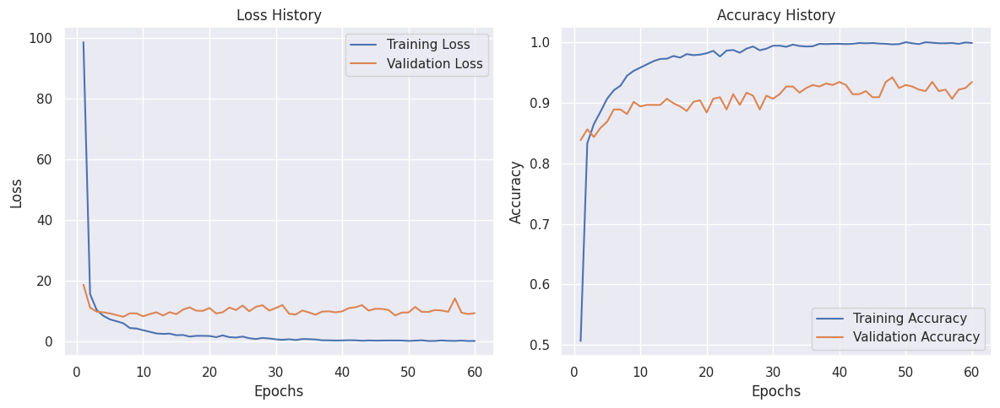

In [ ]:
# Convergence History Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Loss History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_loss_hist, ax=ax[0], label='Training Loss')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_loss_hist, ax=ax[0], label='Validation Loss')

ax[0].set_title('Loss History')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

# Accuracy History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_acc_hist, ax=ax[1], label='Training Accuracy')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_acc_hist, ax=ax[1], label='Validation Accuracy')

ax[1].set_title('Accuracy History')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')

# Legends for each plot
ax[0].legend()
ax[1].legend()

plt.tight_layout()
plt.show()

Validation loss stagnates at around 12 - 15 epochs, which suggests that the model is no longer learning. 60 epochs is likely too many, so the number of epochs should be decreased during fine tuning if the ResNet model is the model selected for fine tuning.

The Training Accuracy reaches 100%, so there is some overfitting, but the ResNet model appears to be working well (Validation Accuracy is ~90%).

### Classification Report, Confusion Matrix and ROC curve for ResNet model

In [ ]:
# Define function for Classification Report
def get_true_and_pred(val_dataloader, model):
    y_true = []
    y_pred = []
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for images, labels in val_dataloader:
            images = images.to(device)  # Move images to the appropriate device
            labels = labels.numpy()  # Convert labels to numpy array

            # Preprocess images using the feature extractor (if needed)
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Get model outputs
            outputs = model(**inputs).logits

            # Get predicted labels
            _, pred = torch.max(outputs.data, 1)
            pred = pred.detach().cpu().numpy()  # Convert predictions to numpy array

            y_true = np.append(y_true, labels)
            y_pred = np.append(y_pred, pred)

    return y_true, y_pred

# Check confusion matrix for error analysis
y_true, y_pred = get_true_and_pred(val_dataloader, model)

# Print classification report
print(classification_report(y_true, y_pred), '\n\n')

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       180
         1.0       0.93      0.95      0.94       216

    accuracy                           0.93       396
   macro avg       0.93      0.93      0.93       396
weighted avg       0.93      0.93      0.93       396
 


Confusion Matrix:
 [[165  15]
 [ 11 205]]


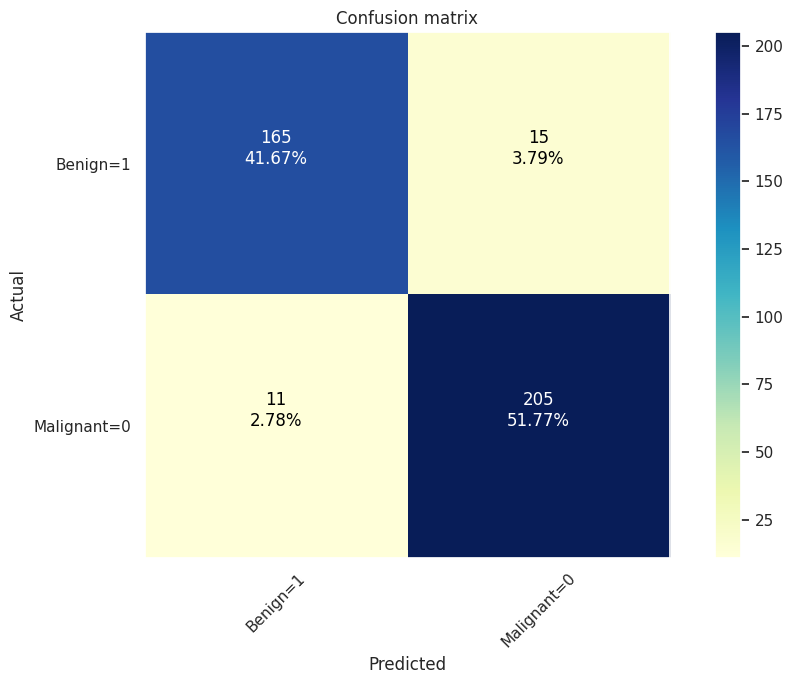

In [ ]:
# Confusion Matrix Plotting Function

def show_confusion_matrix(cm, CLA_label, title='Confusion matrix', cmap=plt.cm.YlGnBu):

    plt.figure(figsize=(10,7))
    plt.grid(False)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(CLA_label))

    plt.xticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()], rotation=45)
    plt.yticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()])

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i,j]}\n{cm[i,j]/np.sum(cm)*100:.2f}%", horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

show_confusion_matrix(cm, CLA_label)

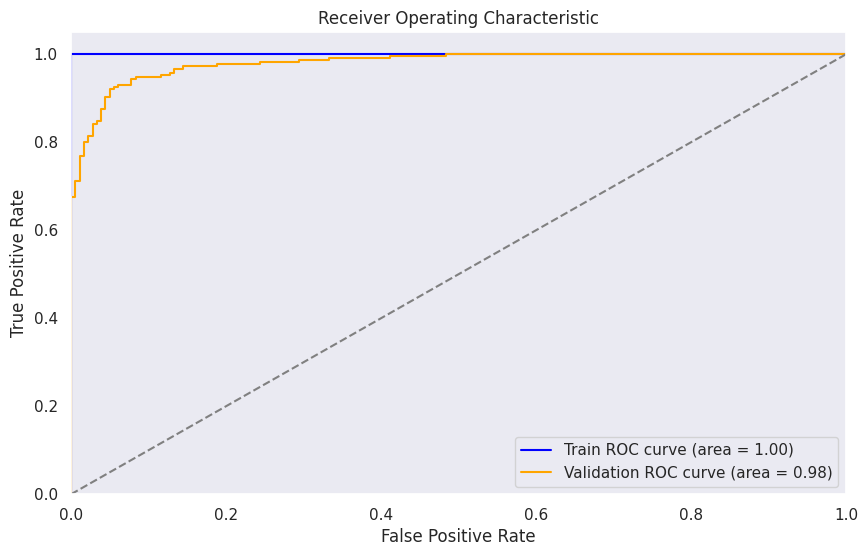

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get predictions and true labels function for ResNet
def get_predictions_and_labels(dataloader, model):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for data in dataloader:
            inputs, labels = data
            inputs = feature_extractor(inputs, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}  # Move inputs to device

            labels = labels.to(device)  # Move labels to the same device

            outputs = model(**inputs).logits  # Get model outputs
            probabilities = torch.softmax(outputs, dim=1)[:, 1]  # Apply softmax and get the class probability for class 1

            all_preds.append(probabilities.cpu().numpy())  # Move to CPU and convert to numpy
            all_labels.append(labels.cpu().numpy())  # Move to CPU and convert to numpy

    return np.concatenate(all_preds), np.concatenate(all_labels)

# Get predictions and true labels for training and validation datasets
train_preds, train_labels = get_predictions_and_labels(train_dataloader, model)
val_preds, val_labels = get_predictions_and_labels(val_dataloader, model)

# Compute ROC curve and AUC for training data
train_fpr, train_tpr, _ = roc_curve(train_labels, train_preds)
train_auc = auc(train_fpr, train_tpr)

# Compute ROC curve and AUC for validation data
val_fpr, val_tpr, _ = roc_curve(val_labels, val_preds)
val_auc = auc(val_fpr, val_tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(train_fpr, train_tpr, color='blue', label=f'Train ROC curve (area = {train_auc:.2f})')
plt.plot(val_fpr, val_tpr, color='orange', label=f'Validation ROC curve (area = {val_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.grid()
plt.show()

### Save ResNet Model

In [ ]:
# Save the model state dictionary (model parameters ie weights and biases)
# AND save the model!
torch.save(model.state_dict(), 'resnet_model.pth')
torch.save(model, "resnet_model.pt")

In [ ]:
# To load the model for later use
#model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Load the model state dictionary
#model.load_state_dict(torch.load("resnet_model.pth"))
#model.eval() # Evaluation mode if being used for inference

In [ ]:
# Ensure model and model state dict are in directory

print(os.listdir())

# Download the saved model

from google.colab import files
files.download('resnet_model.pth')
files.download('resnet_model.pt')

['.config', 'skin-cancer-malignant-vs-benign.zip', 'train', 'notebook_env.db', 'resnet_model.pth', 'data', 'test', 'resnet_model.pt', 'sample_data']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## ViT (Transfer Learning)
*Source: https://www.kaggle.com/code/miladfa7/brain-tumor-detection-vision-transformer-99*

> "We define a ViTForImageClassification, which places a linear layer (nn.Linear) on top of a pre-trained ViTModel. The linear layer is placed on top of the last hidden state of the [CLS] token, which serves as a good representation of an entire image."

> The [model is pre-trained on ImageNet-21k](https://huggingface.co/google/vit-base-patch16-224-in21k), which is a dataset comprised of 14 million labeled images.

To implement a pre-trained Vision Transformer (ViT) Model, I followed [this model code/Kaggle notebook](https://www.kaggle.com/code/miladfa7/brain-tumor-detection-vision-transformer-99) and tried to replicate the processes. Note that the code was altered to fit my dataset (the dataset used in the Kaggle notebook is comprised of MRI scans of the brain).

In [ ]:
# Import the pre-trained ViT model

from transformers import ViTForImageClassification

model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224-in21k',
                                                  id2label = CLA_label)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Define TrainingArguments

TrainingArguments is "a class that contains all of the attributes to customize the training."
* Requires one folder name; checkpoints of the model will be saved to this folder
* All other arguments are optional
* learning_rate used in CNN and ResNet models above will be included here
* Set remove_unused_columns to False so that the image column will be retained (required for data transformations)

At the end of each epoch:
* Evaluation
* Tweak the learning_rate
* Set the training and evaluation batch_sizes
* Customize the number of epochs for training
* Customize the weight decay

In [ ]:
from transformers import TrainingArguments, Trainer

metric_name = "accuracy"

args = TrainingArguments(
    "Skim-Tumor-Detection",
    save_strategy = "epoch",
    evaluation_strategy = "epoch",
    learning_rate = 3e-4, # Same as lr in above models
    per_device_train_batch_size = 32,
    per_device_eval_batch_size = 4,
    num_train_epochs = 5,
    weight_decay = 0.01,
    load_best_model_at_end = True,
    metric_for_best_model = metric_name,
    logging_dir = 'logs',
    remove_unused_columns = False,
)

### compute_metrics for Evaluation

Define compute_metrics function that will compute the selected evaluation metric.

In [ ]:
# compute_metrics function

from sklearn.metrics import accuracy_score

def compute_metrics(eval_pred):
  predictions, labels = eval_pred
  predictions = np.argmax(predictions, axis=1)
  return dict(accuracy = accuracy_score(predictions, labels))

In [ ]:
# Define collate_fn (data_collator function)
# Stack batches correctly and prepare date for Trainer

def collate_fn(batch):
    images, labels = zip(*batch)  # Unzip the batch into images and labels
    pixel_values = torch.stack(images)  # Stack images into a single tensor
    labels = torch.tensor(labels)  # Convert labels to a tensor
    return {"pixel_values": pixel_values, "labels": labels}

In [ ]:
# Define processor

from transformers import ViTImageProcessor

processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

In [ ]:
trainer = Trainer(
    model,
    args,
    train_dataset = train_dataloader,
    eval_dataset = val_dataloader,
    data_collator = collate_fn,
    compute_metrics = compute_metrics,
    tokenizer = processor,
)

### Train the model -- Transfer Learning



In [ ]:
trainer.train()

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


TypeError: 'DataLoader' object is not subscriptable

### Use *PyTorch Tensor Custom Dataset* not DataLoader

**Note**: Need a W&B AI account to run this model! The following prompts will appear:

* wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)

* wandb: You can find your API key in your browser here: https://wandb.ai/authorize

* wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

In [ ]:
trainer = Trainer(
    model,
    args,
    train_dataset = train_dataset,
    eval_dataset = val_dataset,
    data_collator = collate_fn,
    compute_metrics = compute_metrics,
    tokenizer = processor,
)

trainer.train()

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.567016,0.669192
2,No log,0.404297,0.813131
3,No log,0.380662,0.797980
4,No log,0.293244,0.851010
5,No log,0.275822,0.871212


TrainOutput(global_step=355, training_loss=0.4320529991472271, metrics={'train_runtime': 497.4879, 'train_samples_per_second': 22.523, 'train_steps_per_second': 0.714, 'total_flos': 8.682977436315034e+17, 'train_loss': 0.4320529991472271, 'epoch': 5.0})

### Evaluate model performance on the test dataset

In [ ]:
outputs = trainer.predict(val_dataset)
print(outputs.metrics)

{'test_loss': 0.27582183480262756, 'test_accuracy': 0.8712121212121212, 'test_runtime': 5.0345, 'test_samples_per_second': 78.657, 'test_steps_per_second': 19.664}


### Confusion matrix for ViT model

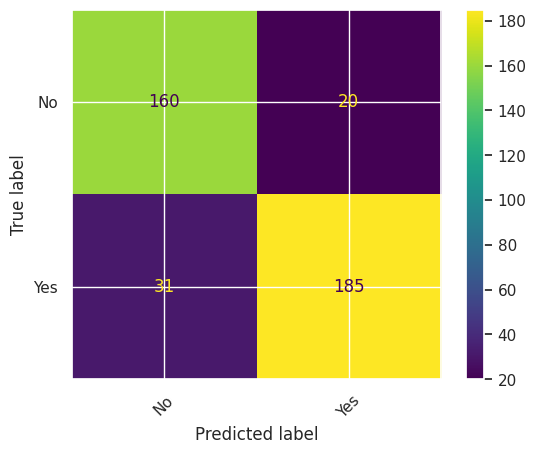

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
labels = ["No", "Yes"]
y_true = outputs.label_ids
y_pred = outputs.predictions.argmax(1)
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(xticks_rotation=45)

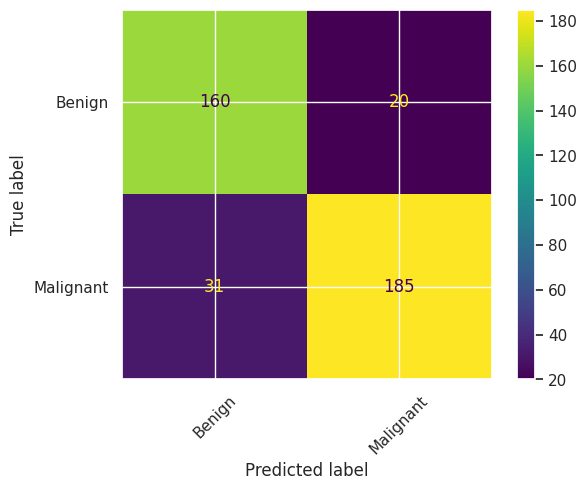

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
labels = CLA_label.values()
y_true = outputs.label_ids
y_pred = outputs.predictions.argmax(1)
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(xticks_rotation=45)

### Classification Report for ViT model

In [ ]:
# Get predictions from the validation dataset
preds_output = trainer.predict(val_dataset)
preds = preds_output.predictions
labels = preds_output.label_ids

# For binary classification
predicted_classes = np.argmax(preds, axis = 1)

# Classification report
report = classification_report(labels, predicted_classes)
print(report)

              precision    recall  f1-score   support

           0       0.84      0.89      0.86       180
           1       0.90      0.86      0.88       216

    accuracy                           0.87       396
   macro avg       0.87      0.87      0.87       396
weighted avg       0.87      0.87      0.87       396



### ROC Curve for ViT model

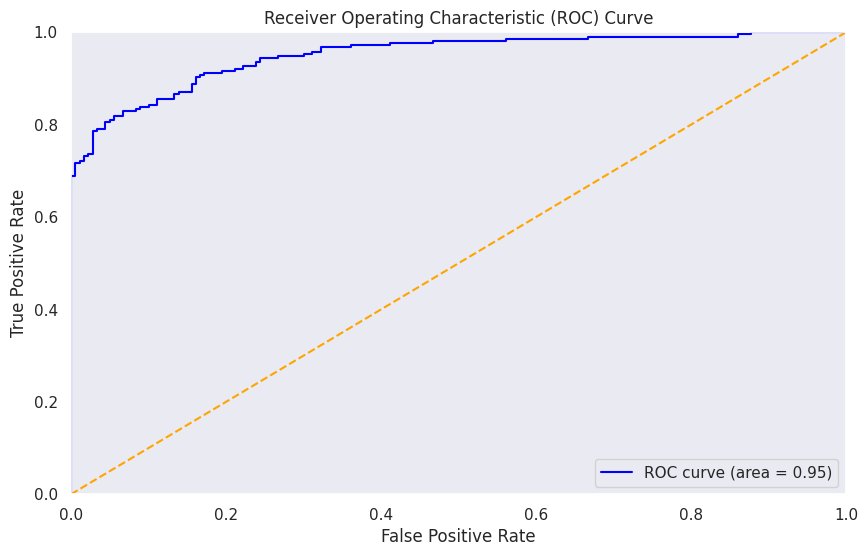

In [ ]:
from sklearn.metrics import roc_curve, auc

# Probability of the positive class
# For binary classification
probs = preds[:, 1]

# Calculate ROC curve

fpr, tpr, thresholds = roc_curve(labels, probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize = (10, 6))
plt.plot(fpr, tpr, color = 'blue', label = 'ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color = 'orange', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')
plt.grid()
plt.show()

## Summary of CNN, ResNet and ViT Model performance metrics

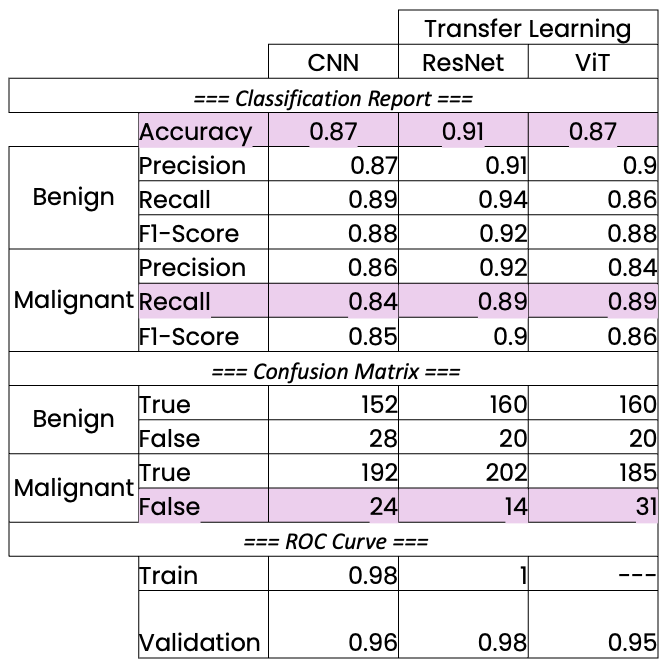

### ResNet is the model with the best performance metrics

The model with the best performance metrics is the **ResNet Model**. It has the
* *Highest accuracy score*
* *Highest Malignant Recall score*
* *Least False Negatives (False Malignant)*
* *Highest ROC*

The Malignant Recall score is prioritized because a higher recall means less false negatives. Again, reducing false negatives is particularly important in this task, as *reducing false negatives means less malignant tumors are misclassified as benign and more malignant tumors are correctly classified as malignant.*

### Methods to improve ResNet performance

Methods to improve the performance metrics of this ResNet model:

1. **Learning Rate Adjustments**
* The learning rate applied here was the learning rate provided in the [model code for the CNN model](https://www.kaggle.com/code/pkdarabi/brain-tumor-detection-by-cnn-pytorch)
* The ResNet model shows convergence, but a smaller learning rate could further improve model convergence
2. **Learning Rate Scheduler**
* Different strategies include StepLR and CyclicLR
* The parameters of ReduceLROnPlateau could also be adjusted (e.g., factor, patience)
3. **Batch Size**
* A larger batch size can provide could provide more stable gradient estimates
* A smaller batch size might introduce more noise, which can be beneficial in some cases
* However, remember that batch size can be limited by memory constraints! Gradient accumulation simulates a larger batch size (accumulates gradients over multiple batches before performing an optimization step)
3. **Data Augmentation**
* Increase the number of transformations in the augmentation layer by including additional transformations such as shifts, zoom, and color adjustments.
* Diversity in the training data helps the model generalize better
4. **Regularization Techniques**
* Addition of *dropout layers* could prevent overfitting
* Addition of *weight decay in the optimizer* (e.g., ```optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-4))```
5. **Number of Epochs & Early Stopping**
* Plot the Loss History for both the Training and Validation dataloaders to monitor loss and see if/when overfitting may be occurring
6. **Fine Tuning**
* Training only the last few layers of the model (i.e., freeze earlier layers) because these layers are where the classification decision occur; *these layers are trained (or fine-tuned) using a new dataset*
* Earlier layers detect more generic and general features, so these layers could be frozen (i.e., weights are unchanged)

## Fine-tuning the ResNet model: Changing hyperparameters

**Decrease the number of epochs**
_________________

The ResNet Loss and Accuracy History plots show that the ResNet stopped learning at around 12-15 epochs. Note that this shortened training time isn't necessarily a bad thing; collectively the performance metrics showed that the model is performing well.

60 epochs were used to train the model to maintain consistency with the training parameters of the CNN model. *The number of epochs will be decreased to 12 - 15 epochs*.

**Reduce patience**
_______________

> "[Patience](https://medium.com/@shouke.wei/optimizing-performance-unveiling-the-impact-of-patience-values-on-machine-learning-models-ef1ff3cbdee5) refers to the number of epochs or iterations that the training process continues without improvement in the evaluation metric before stopping the training early. By stopping the training early, it helps to find an optimal balance between model performance and training time/resources"

Essentially, patience is the number of times the model keeps going after it stops learning.

| Too low | Optimal | Too High |
| :--: | :--: | :--: |
| Premature stopping; <br> model isn't trained enough | Model is robust to variations/invariant, not overfitting, <br> and generalizes well to new, unseen data | Unnecessary training; <br> model overfits and doesn't generalize well |

Patience was set to 20 to maintain consistency with the Patience used to train the CNN model. Upon reflection, this number is consistent with the number of epochs the scientist chose (i.e., 60 epochs).

Finding the optimal Patience often requires testing, but a good rule of thumb is to try a number that is greater than five and less than 10. *Patience will be reduced from 20 to 8*.

**Reduce the learning rate**
______________

>"[Learning rate (λ)](https://towardsdatascience.com/https-medium-com-dashingaditya-rakhecha-understanding-learning-rate-dd5da26bb6de) is one such hyper-parameter that defines the adjustment in the weights of our network with respect to the loss gradient descent. It determines how fast or slow we will move towards the optimal weights."

| Too low | Optimal | Too high |
| :--: | :--: | :--: |
| Model can't distinguish important features; <br> wasted time and resources; more training time; <br> computationally expensive | Model can distinguish important feature(s);<br> converges to something useful  and can be trained in a reasonable amount of time | Model prioritizes noise and less important features; <br> has poor predictive power and accuracy |

The learning rate of the model was set to 3e-4 to maintain consistency with the learning rate of the CNN model. *The learning rate will be reduced to 5e-10*


In [ ]:
# Load the entire model
model = torch.load('resnet_model.pt')
print('ResNet model loaded')

# Set the model to evaluation mode
model.eval()


# Send the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)


# Set the model to evaluation mode initially
model.eval()

# Define Loss Function, Optimizer, and Learning Rate Scheduler
loss_func = nn.NLLLoss(reduction = "sum")
opt = optim.Adam(model.parameters(), lr = 5e-10) # **Reduced the learning rate from 3e-4 to 5e-10**
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode = 'min', factor = 0.5, patience = 8, verbose = 1) # **Reduced patience from 20 to 8**

# Training parameters
num_epochs = 15  # **Reduced the number of training epochs from 60 to 15**

# Lists to store loss and accuracy history
train_loss_hist = []
val_loss_hist = []
train_acc_hist = []
val_acc_hist = []


# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    train_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)

        # Apply LogSoftmax to outputs for NLLLoss
        log_probs = nn.functional.log_softmax(outputs.logits, dim=1)

        # Calculate loss
        loss = loss_func(log_probs, labels)
        train_loss += loss.item()  # Accumulate training loss

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using defined optimizer
        opt.zero_grad()  # Clear gradients for the next step

        # Get predicted labels
        predicted_labels = log_probs.argmax(-1)
        correct += (predicted_labels == labels).sum().item()
        total += labels.size(0)

    # Calculate average training loss and accuracy
    train_loss /= len(train_dataloader)
    train_acc = correct / total
    train_loss_hist.append(train_loss)
    train_acc_hist.append(train_acc)

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    val_loss = 0  # Initialize validation loss
    total = 0

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Apply LogSoftmax to logits for NLLLoss
            log_probs = nn.functional.log_softmax(logits, dim=1)

            # Calculate validation loss
            val_loss += loss_func(log_probs, labels).item()  # Accumulate validation loss

            # Get predicted labels
            predicted_labels = log_probs.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

    # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)  # Calculate the mean validation loss
    val_accuracy /= total  # Calculate the mean validation accuracy

    # Store validation loss and accuracy
    val_loss_hist.append(val_loss)
    val_acc_hist.append(val_accuracy)

    # Print metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")


ResNet model loaded
Epoch 1/15, Training Loss: 0.7888, Training Accuracy: 0.9897, Validation Loss: 14.2262, Validation Accuracy: 0.9116
Epoch 2/15, Training Loss: 0.7005, Training Accuracy: 0.9911, Validation Loss: 12.9637, Validation Accuracy: 0.9040
Epoch 3/15, Training Loss: 1.4279, Training Accuracy: 0.9817, Validation Loss: 12.3080, Validation Accuracy: 0.8965
Epoch 4/15, Training Loss: 0.9467, Training Accuracy: 0.9884, Validation Loss: 13.0453, Validation Accuracy: 0.8990
Epoch 5/15, Training Loss: 1.5180, Training Accuracy: 0.9813, Validation Loss: 16.4095, Validation Accuracy: 0.8687
Epoch 6/15, Training Loss: 1.5914, Training Accuracy: 0.9822, Validation Loss: 13.4967, Validation Accuracy: 0.9040
Epoch 7/15, Training Loss: 1.3976, Training Accuracy: 0.9848, Validation Loss: 12.8756, Validation Accuracy: 0.9141
Epoch 8/15, Training Loss: 0.7900, Training Accuracy: 0.9915, Validation Loss: 13.1494, Validation Accuracy: 0.9116
Epoch 9/15, Training Loss: 1.0193, Training Accuracy

### Loss and Accuracy History Plots for Fine-Tuned ResNet model

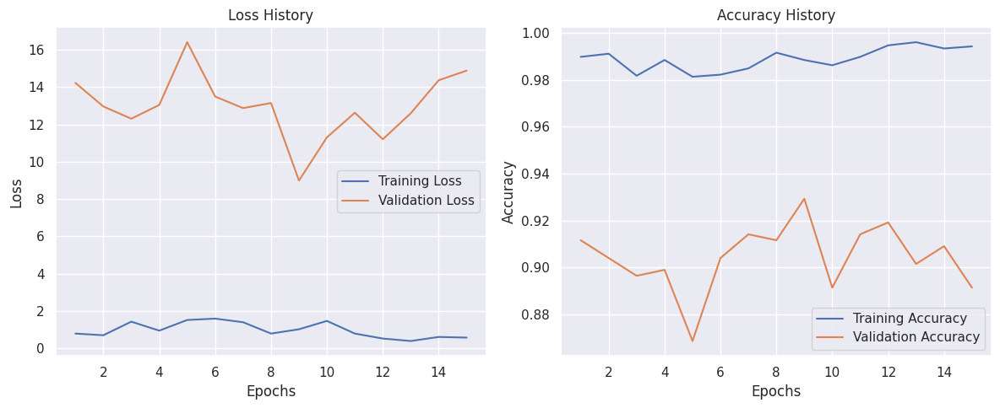

In [ ]:
# Convergence History Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Loss History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_loss_hist, ax=ax[0], label='Training Loss')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_loss_hist, ax=ax[0], label='Validation Loss')

ax[0].set_title('Loss History')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

# Accuracy History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_acc_hist, ax=ax[1], label='Training Accuracy')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_acc_hist, ax=ax[1], label='Validation Accuracy')

ax[1].set_title('Accuracy History')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')

# Legends for each plot
ax[0].legend()
ax[1].legend()

plt.tight_layout()
plt.show()

### Classification Report, Confusion Matrix and ROC curve for Fine-Tuned ResNet model

In [ ]:
# Define function for Classification Report
def get_true_and_pred(val_dataloader, model):
    y_true = []
    y_pred = []
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for images, labels in val_dataloader:
            images = images.to(device)  # Move images to the appropriate device
            labels = labels.numpy()  # Convert labels to numpy array

            # Preprocess images using the feature extractor (if needed)
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Get model outputs
            outputs = model(**inputs).logits

            # Get predicted labels
            _, pred = torch.max(outputs.data, 1)
            pred = pred.detach().cpu().numpy()  # Convert predictions to numpy array

            y_true = np.append(y_true, labels)
            y_pred = np.append(y_pred, pred)

    return y_true, y_pred

# Check confusion matrix for error analysis
y_true, y_pred = get_true_and_pred(val_dataloader, model)

# Print classification report
print(classification_report(y_true, y_pred), '\n\n')

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

              precision    recall  f1-score   support

         0.0       0.92      0.84      0.88       180
         1.0       0.88      0.94      0.91       216
       885.0       0.00      0.00      0.00         0

    accuracy                           0.89       396
   macro avg       0.60      0.59      0.59       396
weighted avg       0.90      0.89      0.89       396
 


Confusion Matrix:
 [[151  28   1]
 [ 14 202   0]
 [  0   0   0]]


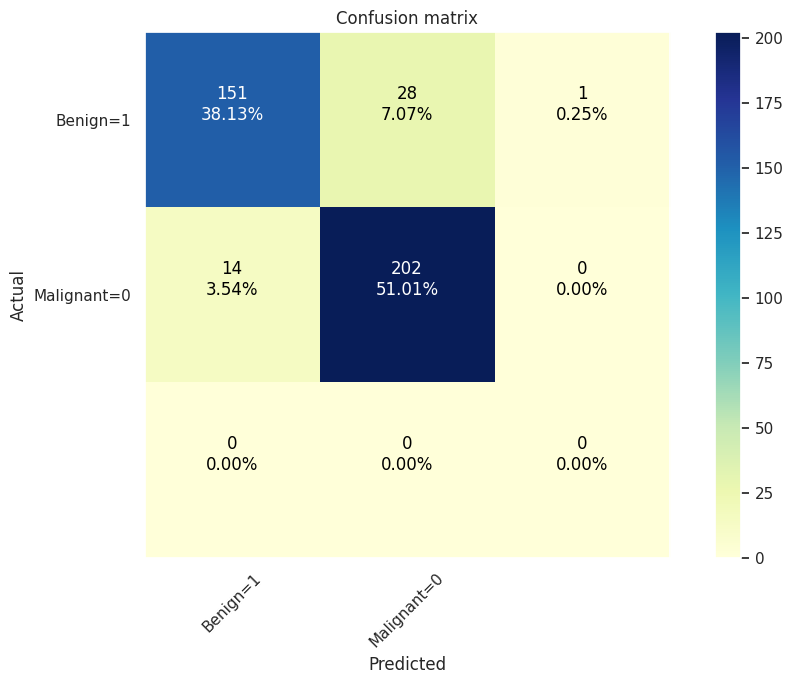

In [ ]:
# Confusion Matrix Plotting Function

def show_confusion_matrix(cm, CLA_label, title='Confusion matrix', cmap=plt.cm.YlGnBu):

    plt.figure(figsize=(10,7))
    plt.grid(False)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(CLA_label))

    plt.xticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()], rotation=45)
    plt.yticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()])

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i,j]}\n{cm[i,j]/np.sum(cm)*100:.2f}%", horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

show_confusion_matrix(cm, CLA_label)

### Output has three classes instead of two -- Fix it!

While the previous code ran successfully, several results seemed strange:

* The Validation Accuracy decreased
* *Three classes were in the output when only two classes exist in the data*

Previously I loaded the model without defining the model architecture and feature extractor. This time I will define the model architecture and feature extractor then load the model state dictionary for the ResNet model I ran on my data.

In [ ]:
# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Load the ResNet model State Dictionary
model.load_state_dict(torch.load('resnet_model.pth'))

# Set the model to evaluation mode
model.eval()

# Send the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define Loss Function, Optimizer, and Learning Rate Scheduler
loss_func = nn.NLLLoss(reduction = "sum")
opt = optim.Adam(model.parameters(), lr = 5e-10) # **Reduced the learning rate from 3e-4 to 5e-10**
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode = 'min', factor = 0.5, patience = 8, verbose = 1) # **Reduced patience from 20 to 8**

# Training parameters
num_epochs = 15  # **Reduced the number of training epochs from 60 to 15**

# Lists to store loss and accuracy history
train_loss_hist = []
val_loss_hist = []
train_acc_hist = []
val_acc_hist = []


# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    train_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)

        # Apply LogSoftmax to outputs for NLLLoss
        log_probs = nn.functional.log_softmax(outputs.logits, dim=1)

        # Calculate loss
        loss = loss_func(log_probs, labels)
        train_loss += loss.item()  # Accumulate training loss

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using defined optimizer
        opt.zero_grad()  # Clear gradients for the next step

        # Get predicted labels
        predicted_labels = log_probs.argmax(-1)
        correct += (predicted_labels == labels).sum().item()
        total += labels.size(0)

    # Calculate average training loss and accuracy
    train_loss /= len(train_dataloader)
    train_acc = correct / total
    train_loss_hist.append(train_loss)
    train_acc_hist.append(train_acc)

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    val_loss = 0  # Initialize validation loss
    total = 0

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Apply LogSoftmax to logits for NLLLoss
            log_probs = nn.functional.log_softmax(logits, dim=1)

            # Calculate validation loss
            val_loss += loss_func(log_probs, labels).item()  # Accumulate validation loss

            # Get predicted labels
            predicted_labels = log_probs.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

    # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)  # Calculate the mean validation loss
    val_accuracy /= total  # Calculate the mean validation accuracy

    # Store validation loss and accuracy
    val_loss_hist.append(val_loss)
    val_acc_hist.append(val_accuracy)

    # Print metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")


Epoch 1/15, Training Loss: 0.1353, Training Accuracy: 0.9987, Validation Loss: 9.6966, Validation Accuracy: 0.9217
Epoch 2/15, Training Loss: 0.1260, Training Accuracy: 0.9987, Validation Loss: 9.0554, Validation Accuracy: 0.9242
Epoch 3/15, Training Loss: 0.0715, Training Accuracy: 0.9991, Validation Loss: 9.0471, Validation Accuracy: 0.9242
Epoch 4/15, Training Loss: 0.1170, Training Accuracy: 0.9991, Validation Loss: 9.1913, Validation Accuracy: 0.9242
Epoch 5/15, Training Loss: 0.0924, Training Accuracy: 0.9991, Validation Loss: 9.9241, Validation Accuracy: 0.9343
Epoch 6/15, Training Loss: 0.1350, Training Accuracy: 0.9991, Validation Loss: 8.6588, Validation Accuracy: 0.9343
Epoch 7/15, Training Loss: 0.1260, Training Accuracy: 0.9978, Validation Loss: 9.5532, Validation Accuracy: 0.9217
Epoch 8/15, Training Loss: 0.1208, Training Accuracy: 0.9987, Validation Loss: 9.3989, Validation Accuracy: 0.9192
Epoch 9/15, Training Loss: 0.1031, Training Accuracy: 0.9991, Validation Loss: 8

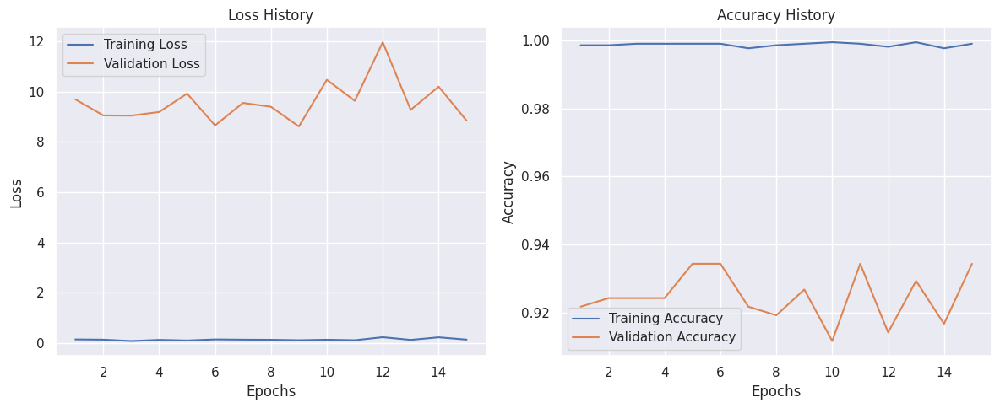

In [ ]:
# Convergence History Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Loss History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_loss_hist, ax=ax[0], label='Training Loss')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_loss_hist, ax=ax[0], label='Validation Loss')

ax[0].set_title('Loss History')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')

# Accuracy History Plot
sns.lineplot(x=[*range(1, num_epochs + 1)], y=train_acc_hist, ax=ax[1], label='Training Accuracy')
sns.lineplot(x=[*range(1, num_epochs + 1)], y=val_acc_hist, ax=ax[1], label='Validation Accuracy')

ax[1].set_title('Accuracy History')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')

# Legends for each plot
ax[0].legend()
ax[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# Define function for Classification Report
def get_true_and_pred(val_dataloader, model):
    y_true = []
    y_pred = []
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for images, labels in val_dataloader:
            images = images.to(device)  # Move images to the appropriate device
            labels = labels.numpy()  # Convert labels to numpy array

            # Preprocess images using the feature extractor (if needed)
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Get model outputs
            outputs = model(**inputs).logits

            # Get predicted labels
            _, pred = torch.max(outputs.data, 1)
            pred = pred.detach().cpu().numpy()  # Convert predictions to numpy array

            y_true = np.append(y_true, labels)
            y_pred = np.append(y_pred, pred)

    return y_true, y_pred

# Check confusion matrix for error analysis
y_true, y_pred = get_true_and_pred(val_dataloader, model)

# Print classification report
print(classification_report(y_true, y_pred), '\n\n')

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       180
         1.0       0.93      0.95      0.94       216

    accuracy                           0.93       396
   macro avg       0.93      0.93      0.93       396
weighted avg       0.93      0.93      0.93       396
 


Confusion Matrix:
 [[165  15]
 [ 11 205]]


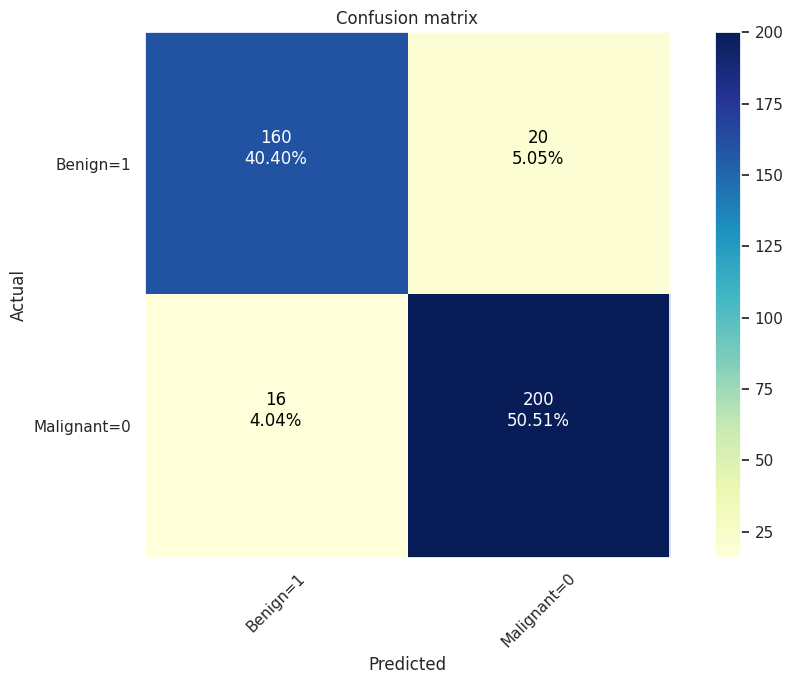

In [ ]:
# Confusion Matrix Plotting Function

def show_confusion_matrix(cm, CLA_label, title='Confusion matrix', cmap=plt.cm.YlGnBu):

    plt.figure(figsize=(10,7))
    plt.grid(False)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(CLA_label))

    plt.xticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()], rotation=45)
    plt.yticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()])

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i,j]}\n{cm[i,j]/np.sum(cm)*100:.2f}%", horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

show_confusion_matrix(cm, CLA_label)

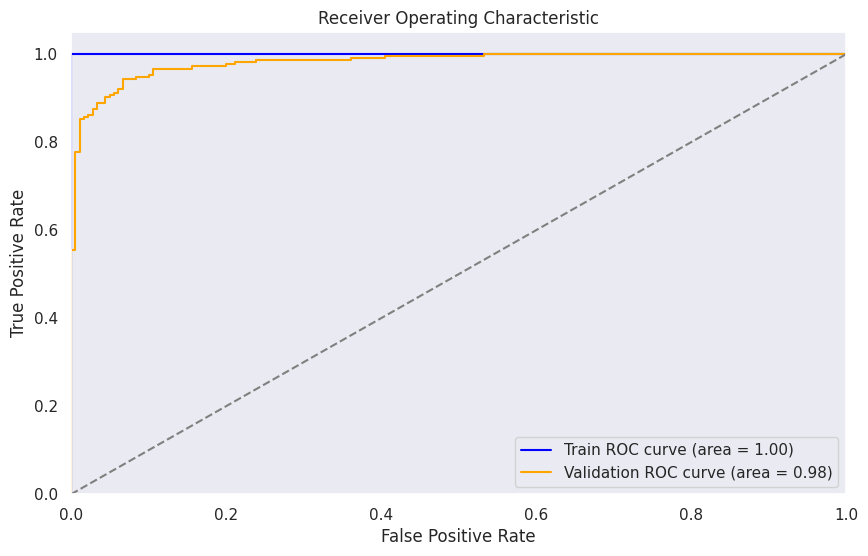

In [ ]:
from sklearn.metrics import roc_curve, auc

# Get predictions and true labels function for ResNet
def get_predictions_and_labels(dataloader, model):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for data in dataloader:
            inputs, labels = data
            inputs = feature_extractor(inputs, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}  # Move inputs to device

            labels = labels.to(device)  # Move labels to the same device

            outputs = model(**inputs).logits  # Get model outputs
            probabilities = torch.softmax(outputs, dim=1)[:, 1]  # Apply softmax and get the class probability for class 1

            all_preds.append(probabilities.cpu().numpy())  # Move to CPU and convert to numpy
            all_labels.append(labels.cpu().numpy())  # Move to CPU and convert to numpy

    return np.concatenate(all_preds), np.concatenate(all_labels)

# Get predictions and true labels for training and validation datasets
train_preds, train_labels = get_predictions_and_labels(train_dataloader, model)
val_preds, val_labels = get_predictions_and_labels(val_dataloader, model)

# Compute ROC curve and AUC for training data
train_fpr, train_tpr, _ = roc_curve(train_labels, train_preds)
train_auc = auc(train_fpr, train_tpr)

# Compute ROC curve and AUC for validation data
val_fpr, val_tpr, _ = roc_curve(val_labels, val_preds)
val_auc = auc(val_fpr, val_tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(train_fpr, train_tpr, color='blue', label=f'Train ROC curve (area = {train_auc:.2f})')
plt.plot(val_fpr, val_tpr, color='orange', label=f'Validation ROC curve (area = {val_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.grid()
plt.show()

### Reducing the learning rate, number of epochs and patience maintained Accuracy but reduced Malignant Recall

Fine-tuning hyperparameters lowered the recall from 0.94 to 0.92. The number of False Negatives/False Malignants increased from 11 to 16, which is not ideal for this particular task--Malignant tumors that are misclassified as Benign need to be reduced.

Since Recall is critical, I'm wondering how to improve Recall without reducing Precision or Accuracy; yes, a tradeoff often exists between Precision and Recall, but I'm curious to see if the threshold can or should be adjusted. I'll take a look at the Precision-Recall curve to see if the threshold needs to be adjusted.

#### Precision-Recall curve


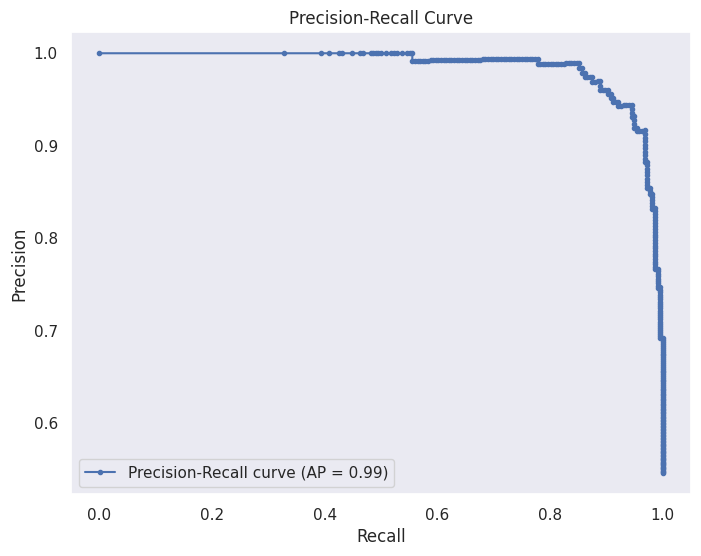

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, average_precision_score

# Define function for obtaining true and predicted values
def get_true_and_pred(val_dataloader, model):
    y_true = []
    y_pred = []
    y_scores = []  # To store predicted probabilities
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for images, labels in val_dataloader:
            images = images.to(device)  # Move images to the appropriate device
            labels = labels.numpy()  # Convert labels to numpy array

            # Preprocess images using the feature extractor (if needed)
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Get model outputs
            outputs = model(**inputs).logits

            # Get predicted probabilities (for the positive class)
            probabilities = torch.softmax(outputs, dim=1)[:, 1].detach().cpu().numpy()
            y_scores.extend(probabilities)  # Store predicted probabilities

            # Get predicted labels
            _, pred = torch.max(outputs.data, 1)
            pred = pred.detach().cpu().numpy()  # Convert predictions to numpy array

            y_true.extend(labels)  # Use extend instead of np.append for better performance
            y_pred.extend(pred)

    return np.array(y_true), np.array(y_pred), np.array(y_scores)  # Return scores as well

# Get true labels, predicted labels, and predicted probabilities
y_true, y_pred, y_scores = get_true_and_pred(val_dataloader, model)

# Calculate precision and recall
precision, recall, _ = precision_recall_curve(y_true, y_scores)

# Calculate average precision score
average_precision = average_precision_score(y_true, y_scores)

# Plotting the Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label='Precision-Recall curve (AP = {:.2f})'.format(average_precision))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()


The Precision-Recall curve and Average Precision score show that the model is performing very well. The AP score of 0.99 achieves high precision and high recall. Lowering the threshold to increase recall could result in reduced accuracy and precision, and all tumors being classified as positive.

Out of curiousity, I would like to use a "quick-and-dirty" method to see if Recall could be increased above 0.94 without sacrificing/reducing Accuracy and/or Precision.

In [ ]:
precision, recall, thresholds = precision_recall_curve(y_true, y_scores)

# Find the optimal threshold to maximize recall
desired_recall = 1.0  # Desired recall level
optimal_threshold = None

# Iterate through thresholds to find the one that meets the desired recall
for i in range(len(recall)):
    if recall[i] >= desired_recall:
        optimal_threshold = thresholds[i]
        break

print(f"Optimal Threshold for Recall >= {desired_recall}: {optimal_threshold}")

# Make predictions based on the new threshold
y_pred_adjusted = (y_scores >= optimal_threshold).astype(int)

# Now you can evaluate the model using the adjusted predictions
from sklearn.metrics import classification_report, confusion_matrix

# Print the updated classification report
print(classification_report(y_true, y_pred_adjusted), '\n\n')

# Generate confusion matrix for the adjusted predictions
cm_adjusted = confusion_matrix(y_true, y_pred_adjusted)
print("Confusion Matrix (Adjusted Predictions):\n", cm_adjusted)


Optimal Threshold for Recall >= 1.0: 4.101869397529073e-13
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       180
           1       0.55      1.00      0.71       216

    accuracy                           0.55       396
   macro avg       0.27      0.50      0.35       396
weighted avg       0.30      0.55      0.39       396
 


Confusion Matrix (Adjusted Predictions):
 [[  0 180]
 [  0 216]]


In [ ]:
precision, recall, thresholds = precision_recall_curve(y_true, y_scores)

# Find the optimal threshold to maximize recall
desired_recall = 0.95  # Desired recall level
optimal_threshold = None

# Iterate through thresholds to find the one that meets the desired recall
for i in range(len(recall)):
    if recall[i] >= desired_recall:
        optimal_threshold = thresholds[i]
        break

print(f"Optimal Threshold for Recall >= {desired_recall}: {optimal_threshold}")

# Make predictions based on the new threshold
y_pred_adjusted = (y_scores >= optimal_threshold).astype(int)

# Now you can evaluate the model using the adjusted predictions
from sklearn.metrics import classification_report, confusion_matrix

# Print the updated classification report
print(classification_report(y_true, y_pred_adjusted), '\n\n')

# Generate confusion matrix for the adjusted predictions
cm_adjusted = confusion_matrix(y_true, y_pred_adjusted)
print("Confusion Matrix (Adjusted Predictions):\n", cm_adjusted)


Optimal Threshold for Recall >= 0.95: 4.101869397529073e-13
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       180
           1       0.55      1.00      0.71       216

    accuracy                           0.55       396
   macro avg       0.27      0.50      0.35       396
weighted avg       0.30      0.55      0.39       396
 


Confusion Matrix (Adjusted Predictions):
 [[  0 180]
 [  0 216]]


Trying to adjust the threshold for Recall to >=0.95 markedly reduces Precision and Accuracy. I will not attempt to adjust the threshold to improve Recall.

Upon review of the code, I wondered if the ```feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")``` was necessary for fine tuning and I wanted to learn more about exactly what the Auto Feature Extractor from HuggingFace is doing to the data. According to the Hugging Face documentation,
> "Feature extractor is in charge of preparing input features for a multi-modal model. This includes feature extraction from sequences, e.g., pre-processing audio files to Log-Mel Spectrogram features, feature extraction from images e.g. cropping image image files, but also padding, normalization, and conversion to Numpy, PyTorch, and TensorFlow tensors."

I wondered if the pre-processing involved in this function included additional transformations outside of the augmentation layer. I tried running the model without the Feature Extractor to see how/if it affected model performance.

In [ ]:
# Load the and model
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Load the ResNet model State Dictionary
model.load_state_dict(torch.load('resnet_model.pth'))

# Set the model to evaluation mode
model.eval()

# Send the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define Loss Function, Optimizer, and Learning Rate Scheduler
loss_func = nn.NLLLoss(reduction = "sum")
opt = optim.Adam(model.parameters(), lr = 5e-10) # **Reduced the learning rate from 3e-4 to 5e-10**
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(opt, mode = 'min', factor = 0.5, patience = 8, verbose = 1) # **Reduced patience from 20 to 8**

# Training parameters
num_epochs = 15  # **Reduced the number of training epochs from 60 to 15**

# Lists to store loss and accuracy history
train_loss_hist = []
val_loss_hist = []
train_acc_hist = []
val_acc_hist = []


# Training DataLoader and Validation DataLoader
for epoch in range(num_epochs):
    # Training Loop
    model.train()  # Set model to training mode
    train_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_dataloader:
        # Move images and labels to the appropriate device
        images, labels = images.to(device), labels.to(device)

        # Preprocess the images using the feature extractor
        inputs = feature_extractor(images, return_tensors="pt", padding=True)
        inputs = {key: value.to(device) for key, value in inputs.items()}

        # Forward pass
        outputs = model(**inputs)

        # Apply LogSoftmax to outputs for NLLLoss
        log_probs = nn.functional.log_softmax(outputs.logits, dim=1)

        # Calculate loss
        loss = loss_func(log_probs, labels)
        train_loss += loss.item()  # Accumulate training loss

        # Backward pass and optimization step
        loss.backward()
        opt.step()  # Update weights using defined optimizer
        opt.zero_grad()  # Clear gradients for the next step

        # Get predicted labels
        predicted_labels = log_probs.argmax(-1)
        correct += (predicted_labels == labels).sum().item()
        total += labels.size(0)

    # Calculate average training loss and accuracy
    train_loss /= len(train_dataloader)
    train_acc = correct / total
    train_loss_hist.append(train_loss)
    train_acc_hist.append(train_acc)

    # Validation Loop
    model.eval()  # Set model to evaluation mode
    val_accuracy = 0
    val_loss = 0  # Initialize validation loss
    total = 0

    with torch.no_grad():
        for images, labels in val_dataloader:
            images, labels = images.to(device), labels.to(device)

            # Preprocess the images using the feature extractor
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Forward pass through the model
            logits = model(**inputs).logits

            # Apply LogSoftmax to logits for NLLLoss
            log_probs = nn.functional.log_softmax(logits, dim=1)

            # Calculate validation loss
            val_loss += loss_func(log_probs, labels).item()  # Accumulate validation loss

            # Get predicted labels
            predicted_labels = log_probs.argmax(-1)

            # Calculate accuracy
            val_accuracy += (predicted_labels == labels).sum().item()
            total += labels.size(0)

    # Calculate average validation loss and accuracy
    val_loss /= len(val_dataloader)  # Calculate the mean validation loss
    val_accuracy /= total  # Calculate the mean validation accuracy

    # Store validation loss and accuracy
    val_loss_hist.append(val_loss)
    val_acc_hist.append(val_accuracy)

    # Print metrics for the epoch
    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}, "
          f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")


Epoch 1/15, Training Loss: 0.0813, Training Accuracy: 0.9996, Validation Loss: 9.3196, Validation Accuracy: 0.9242
Epoch 2/15, Training Loss: 0.1529, Training Accuracy: 0.9982, Validation Loss: 9.9200, Validation Accuracy: 0.9268
Epoch 3/15, Training Loss: 0.1513, Training Accuracy: 0.9987, Validation Loss: 9.9801, Validation Accuracy: 0.9268
Epoch 4/15, Training Loss: 0.0823, Training Accuracy: 1.0000, Validation Loss: 10.8305, Validation Accuracy: 0.9217
Epoch 5/15, Training Loss: 0.1432, Training Accuracy: 0.9987, Validation Loss: 10.1970, Validation Accuracy: 0.9141
Epoch 6/15, Training Loss: 0.1028, Training Accuracy: 0.9982, Validation Loss: 9.5889, Validation Accuracy: 0.9394
Epoch 7/15, Training Loss: 0.1722, Training Accuracy: 0.9982, Validation Loss: 10.1533, Validation Accuracy: 0.9268
Epoch 8/15, Training Loss: 0.0931, Training Accuracy: 0.9996, Validation Loss: 9.0133, Validation Accuracy: 0.9192
Epoch 9/15, Training Loss: 0.1733, Training Accuracy: 0.9978, Validation Loss

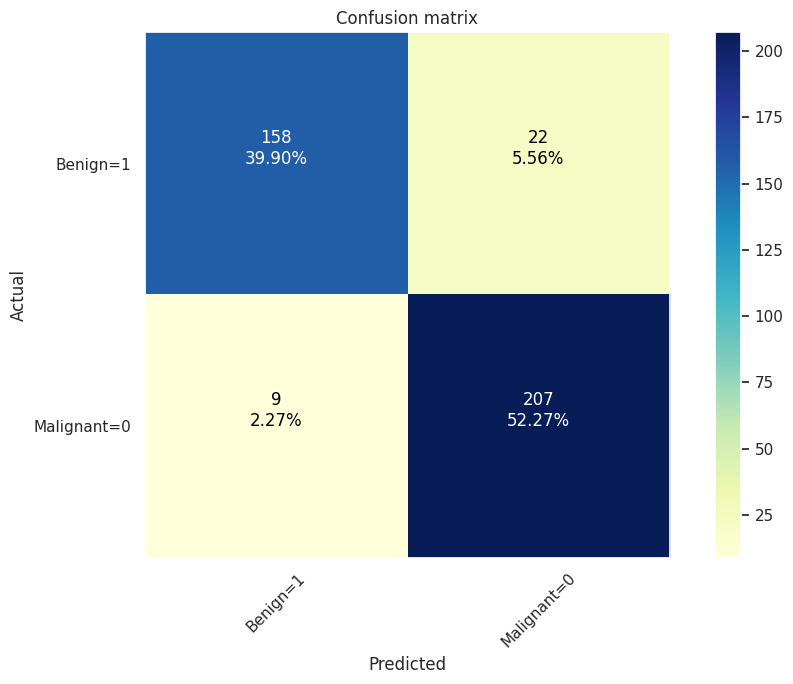

In [ ]:
# Confusion Matrix Plotting Function

def show_confusion_matrix(cm, CLA_label, title='Confusion matrix', cmap=plt.cm.YlGnBu):

    plt.figure(figsize=(10,7))
    plt.grid(False)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(CLA_label))

    plt.xticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()], rotation=45)
    plt.yticks(tick_marks, [f"{value}={key}" for key , value in CLA_label.items()])

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f"{cm[i,j]}\n{cm[i,j]/np.sum(cm)*100:.2f}%", horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

show_confusion_matrix(cm, CLA_label)

In [ ]:
# Define function for Classification Report
def get_true_and_pred(val_dataloader, model):
    y_true = []
    y_pred = []
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for images, labels in val_dataloader:
            images = images.to(device)  # Move images to the appropriate device
            labels = labels.numpy()  # Convert labels to numpy array

            # Preprocess images using the feature extractor (if needed)
            inputs = feature_extractor(images, return_tensors="pt", padding=True)
            inputs = {key: value.to(device) for key, value in inputs.items()}

            # Get model outputs
            outputs = model(**inputs).logits

            # Get predicted labels
            _, pred = torch.max(outputs.data, 1)
            pred = pred.detach().cpu().numpy()  # Convert predictions to numpy array

            y_true = np.append(y_true, labels)
            y_pred = np.append(y_pred, pred)

    return y_true, y_pred

# Check confusion matrix for error analysis
y_true, y_pred = get_true_and_pred(val_dataloader, model)

# Print classification report
print(classification_report(y_true, y_pred), '\n\n')

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

              precision    recall  f1-score   support

         0.0       0.95      0.88      0.91       180
         1.0       0.90      0.96      0.93       216

    accuracy                           0.92       396
   macro avg       0.93      0.92      0.92       396
weighted avg       0.92      0.92      0.92       396
 


Confusion Matrix:
 [[158  22]
 [  9 207]]


Removing the Feature Extractor incrased Recall and decreased the number of misclassified Malignant tumors, but Accuracy decreased slightly and the number of Benign tumors that were classified correctly decreased and Benign tumors that were misclassified incorrectly as Malignant increased.

These results show that changing the threshold to inrease Recall results in decreased Accuracy and Precision.

Another fine-tuning strategy that can be used to improve model performance is to train the model on new and/or additional images (i.e., increasing the size of training dataset).

## A high-performing ResNet model for the classification of skin tumors

In this notebook, several computer vision models were implemented to develop a classifier on skin tumor images. Transfer Learning was demonstrated by applying a pre-trained ResNet model and a pre-trained ViT to the data. Of the three models, the ResNet model had the best performance metrics:

* 93% Accuracy
* 94% Malignant Recall
* 205 True Malignant Classification
* 11 False Malignant Classification
* ROC: 0.98


Attempts to improve model performance further included the following strategies:

* Fine-Tuning of Layers
* Fine-Tuning of certain hyperparametrs
  * Learning rate, number of epochs, and patience were reduced

Unfortunately, the strategy to perform Fine-Tuning of specific layers was incomplete. I can learn more about how to fine tune the last layer and complete this effort in another notebook. Specifically, I would fine tune the last layer or last few layers of the model because that is where the classification decision occurs.

Fine-Tuning certain hyperparameters was completed sucessfully. The decrease in learning rate, number of epochs, and patience did not affect Accuracy, but resulted in slightly decreased Recall and a concomitant slight increase in misclassified Malignant tumors. The Precision-Recall curve and AP score of 0.99 showed that this fine-tuned model is performing well, but I wanted to see if lowering the threshold would improve Malignant Recall (to >0.94) and decrease the number of Malignant tumors that were misclassified as Benign. Unfortunately, adjusting the threshold such that Malignant Recall would be >=0.95 resulted in markedly decreased accuracy.

A follow-up Fine-Tuning strategy that could be implemented is increasing the number of samples in the training data. Several methods to increase the number of samples in the training data include
* Increasing the number of transformations in the augmentation layer
  * The augmentation layer here included only Random Horizontal Flip and Random Vertical Flip, but [many other Pytorch transformations exist](https://pytorch.org/vision/0.9/transforms.html), such as Random Rotation, Random Sized Crop, Center Crop, and Color Jitter
* Adding new samples/photos from [other collections in the ISIC database](https://api.isic-archive.com/collections/?pinned=true)

Additional follow-up work that would provide useful insight would be to see if this model is generalizable. As mentioned earlier in the notebook, the photos in the ISIC database are not uniform. A random sampling of photos showed that most photos are close-up shots of the tumor, but non-tumoral elements are present in the samples/photos.

Images from the [Challenge 2017: Validation](https://api.isic-archive.com/collections/71/) collection include circular shapes of various colors

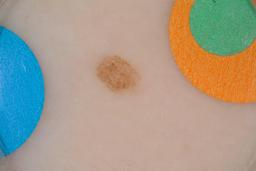

Images from the [Challenge 2018: Test](https://api.isic-archive.com/collections/64/) collection include markings of various shapes and sizes

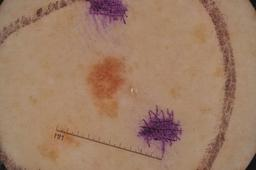

Sometimes the image will contain the [presence of the indicated extremity](https://api.isic-archive.com/collections/70/?page=8) as well

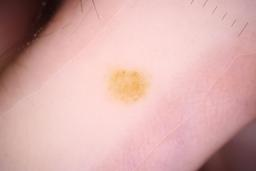

I would like to know how it performs on a collection that contains non-tumoral elements like those present in the 2017 Validation set (listed above; many of those images contain circular dots of various colors and sizes). Note that the collection used to train the model in this notebook didn't appear to contain these particular non-tumoral elements with meaningful frequency. From what I've learned about Computer Vision, the model can and will learn from everything that it "sees" and is present in the image/sample. I wonder the extent to which non-tumoral elements, like scales or markings, affect the model and classification decision if they occur regularly or frequently enough in the training dataset.

### Assessing Generalizability of ResNet model: Performance on Test dataset (new, unseen data).

In [ ]:
# Test dataset

test_df

,image_path,label,label_encoded
0,/content/test/malignant/436.jpg,malignant,0
1,/content/test/malignant/1229.jpg,malignant,0
2,/content/test/benign/1074.jpg,benign,1
3,/content/test/malignant/839.jpg,malignant,0
4,/content/test/benign/790.jpg,benign,1
...,...,...,...
655,/content/test/benign/1042.jpg,benign,1
656,/content/test/benign/725.jpg,benign,1
657,/content/test/benign/1173.jpg,benign,1
658,/content/test/malignant/992.jpg,malignant,0


Feature batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])


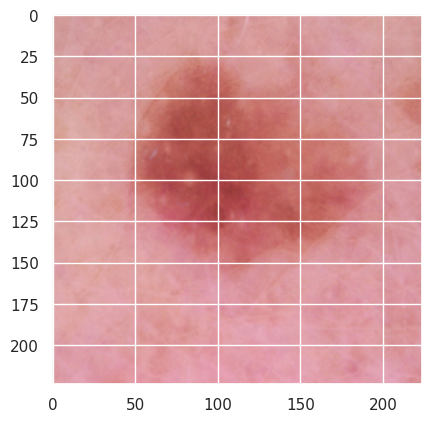

Benign


In [ ]:
# Create test dataloader

# Create an instance of the custom dataset (Pandas DF --> PyTorch Tensor)
test_dataset = CustomDataset(test_df, transform = augmentation_layer)

# Create the DataLoader using the custom dataset
test_dataloader = DataLoader(test_dataset, batch_size=CFG_pt.BATCH_SIZE, shuffle = True)

# Display image and label
test_features, test_labels = next(iter(test_dataloader))
print(f"Feature batch shape: {test_features.size()}")
print(f"Labels batch shape: {test_labels.size()}")
img = test_features[0].squeeze()
img = img.permute(1,2, 0) # Change order of dimensions
label = test_labels[0]
CLA_label = {
    1 : 'Benign',
    0 : 'Malignant'
}
plt.imshow(img, cmap = "inferno")
plt.show()
print(CLA_label[label.item()])

In [ ]:
# Mount the drive
# Access the saved resnet model
# and its weights from Training

from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
os.listdir()

['.config',
 'data',
 'skin-cancer-malignant-vs-benign.zip',
 'drive',
 'train',
 'notebook_env.db',
 'resnet_model.pt',
 'test',
 'resnet_model.pth',
 'sample_data']

In [ ]:
# Load the saved Resnet model and its weights

import torch
from transformers import AutoFeatureExtractor, ResNetForImageClassification

# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Load the ResNet model State Dictionary
model.load_state_dict(torch.load('resnet_model.pth'))



<All keys matched successfully>

In [ ]:
import torch
from transformers import AutoFeatureExtractor, ResNetForImageClassification

# Load the feature extractor and model
feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

# Load the ResNet model
saved_resnet_model = torch.load('resnet_model.pt')



In [ ]:
# Include the corresponding columns for 'image' and 'label' in PandasDataFrame
        image = read_image(self.df.iloc[idx]['image_path'])  # Access image data using iloc
        label = self.df.iloc[idx]['label_encoded']  # Access label data using iloc


In [ ]:
test_dataloader

In [ ]:
# Get a single batch from the test_dataloader
images, labels = next(iter(test_dataloader))

# Print the shape of the images tensor
print("Shape of images in test_dataloader:", images.shape)


Shape of images in test_dataloader: torch.Size([32, 3, 224, 224])


In [ ]:
print(saved_resnet_model.config.num_channels)

3


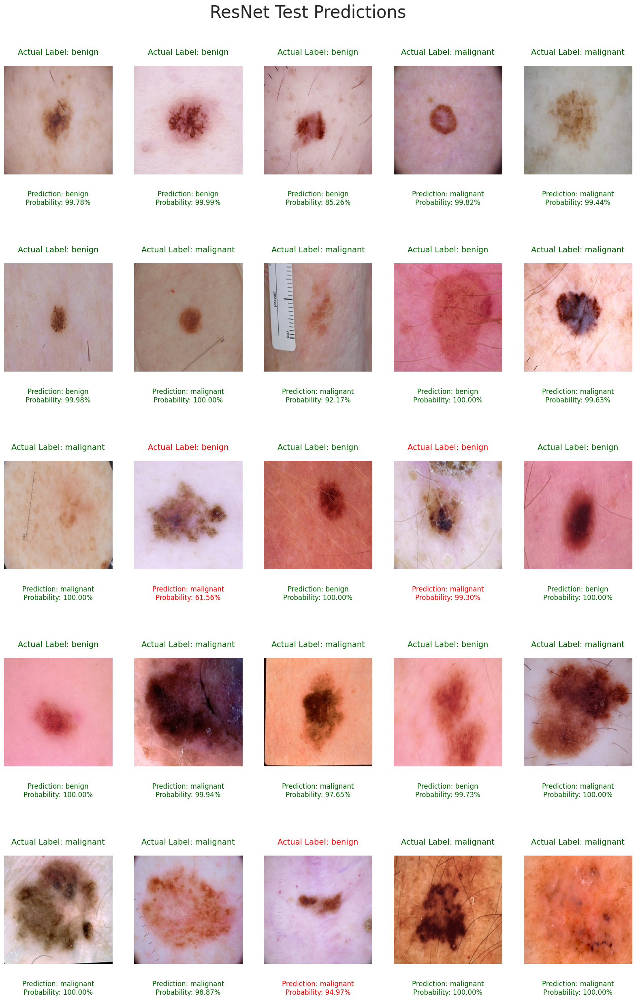

In [ ]:
# Look at predictions and probabilities
# of saved ResNet model on Test data

import torch
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms as transforms

# Define normalization based on ResNet preprocessing
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

# Define label mapping; adjust as needed based on model output
label_set = {0: 'malignant', 1: 'benign'}

def visualize_predictions(data_loader, model, count=25, color_map='inferno', title=None, fig_size=(20, 28)):
    model.eval()  # Set model to evaluation mode
    device = next(model.parameters()).device  # Ensure images are moved to the correct device

    rows = count // 5
    if count % 5 > 0:
        rows += 1

    fig = plt.figure(figsize=fig_size)
    if title is not None:
        fig.suptitle(title, fontsize=30)

    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

    # Define color mappings for prediction correctness
    color_set = {True: 'darkgreen', False: 'red'}

    data_iter = iter(data_loader)
    for column in range(count):
        try:
            images, labels = next(data_iter)  # Get a batch of images and labels
        except StopIteration:
            data_iter = iter(data_loader)
            images, labels = next(data_iter)

        # Select a single image and label from the batch
        image = images[0].to(device)  # Select the first image in the batch
        label = labels[0]

        # Convert image to float and scale to [0, 1], then normalize
        image = image.float() / 255.0
        image = normalize(image)

        # Predict the label
        with torch.no_grad():
            output = model(image.unsqueeze(0))
            probabilities = torch.softmax(output.logits, dim=1).squeeze().cpu().numpy()

        prediction = np.argmax(probabilities)
        predicted_probability = probabilities[prediction]
        actual_label = label.item()
        correct_prediction = prediction == actual_label

        # Check for unexpected prediction values
        predicted_label = label_set.get(prediction, "Unknown")

        # Plot image
        ax = plt.subplot(rows, 5, column + 1)

        # Title with actual label and color-coded correctness
        ax.set_title(
            f'Actual Label: {label_set.get(actual_label, "Unknown")}',
            pad=20,
            fontsize=14,
            color=color_set[correct_prediction]
        )

        # De-normalize for display
        img = image.cpu().permute(1, 2, 0).numpy()
        img = (img * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)

        ax.imshow(img, cmap=color_map if color_map != 'rgb' else None)
        ax.axis('off')

        # Display predicted label and probability information using plt.text
        txt = (
            f'Prediction: {predicted_label}\n'
            f'Probability: {predicted_probability * 100:.2f}%'
        )
        ax.text(0.5, -0.15, txt, ha='center', va='top', transform=ax.transAxes, fontsize=12, color=color_set[correct_prediction])

    plt.show()

# Usage
visualize_predictions(
    test_dataloader,
    saved_resnet_model,
    count=25,
    color_map='inferno',
    title='ResNet Test Predictions'
)


In [ ]:
# Get ResNet model predictions on Test data

# Set model to evaluation mode
saved_resnet_model.eval()

# Move the model and data to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
saved_resnet_model.to(device)

all_preds = []
all_labels = []

# Transformation normalization values for the Hugging Face ResNet
# These are the same as the default ImageNet values, which the model expects
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

# Iterate through the DataLoader
with torch.no_grad():  # No need for gradients in evaluation
    for images, labels in test_dataloader:
        # Move images and labels to the device
        images, labels = images.to(device), labels.to(device)

        # Convert images to float and scale to [0, 1]
        images = images.float() / 255.0
        # Normalize according to model requirements
        images = normalize(images)

        # Run the model on the batch of images
        outputs = saved_resnet_model(images)  # Use the correct model variable here

        # Get predictions by taking the argmax over class probabilities
        _, preds = torch.max(outputs.logits, 1)  # Access `outputs.logits` for Hugging Face models

        # Collect predictions and labels
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Optionally, print or further process the predictions and labels
print("Predictions:", all_preds[:10])  # Show the first 10 predictions
print("Labels:", all_labels[:10])      # Show the first 10 labels


Predictions: [1, 1, 1, 0, 1, 0, 1, 0, 0, 1]
Labels: [1, 1, 1, 1, 0, 0, 0, 0, 0, 0]


In [ ]:
# Get classification report

# Define class names based on the label mapping
class_names = ['malignant', 'benign']  # 0: malignant, 1: benign

# Check unique values in all_preds and all_labels to identify any unexpected classes
print("Unique values in predictions:", set(all_preds))
print("Unique values in labels:", set(all_labels))

# Generate classification report, specifying labels for 0 and 1 only
report = classification_report(all_labels, all_preds, target_names=class_names, labels=[0, 1])
print(report)

Unique values in predictions: {0, 1, 887}
Unique values in labels: {0, 1}
              precision    recall  f1-score   support

   malignant       0.90      0.83      0.86       300
      benign       0.87      0.93      0.90       360

   micro avg       0.88      0.88      0.88       660
   macro avg       0.88      0.88      0.88       660
weighted avg       0.88      0.88      0.88       660



## A high-performing ResNet model that generalizes well!

Transfer Learning and Fine-Tuning of CNNs and ViTs in the development of a precise and accurate model for skin cancer diagnosis represent an active, robust field of research and study. Recently, in February 2024, [Alroobaea et al. published their "hybrid U-Net and improved MobileNet-V3" model for skin cancer diagnosis in Nature Scientific Reports](https://www.nature.com/articles/s41598-024-54212-8#ref-CR1). Key factors employed in the development of their model include the following:
* **Data Augmentation** of the [HAM-10000 Melanoma Skin Cancer dataset](https://api.isic-archive.com/collections/212/)
  * Rotation 25 degrees
  * Width and height shiting 15%
  * Shearing 15%
  * Flipping in both vertical and horizontal directions
  * Adjusting brightness within the [0.9: 1.5] range
* Model is based on **Standard U-Net and Improved MobileNet-V3 with optimization techniques**
  * Semantic segmentation by Standard U-Net
  * MobileNet-V3 is the Feature Extractor
  * Bayesion optimization method for hyper parameter optimization
* **Architectural improvements of MobleNet-V3**
  * Deeper model
  * Wider model
  * Substitution of the crossed-entropy loss function with a bias loss function
  * Model's squeeze and excitation (SE) component was replaced with the adequate channel attention (ECA) component
  * Application of Dropout layers
  * L2 regularization's weight decay

Ultimately, "the combined utilization of the U-Net and MobileNet-V3 models yielded exceptional results in classifying skin cancer diseases." The model
> "*Demonstrated a set of validation results with an accuracy of 98.86% wherein the precision, recall, and F1-score all surpassed 95%*"

> *Distinguished between cancerous and non-cancerous tumors with an ROC-AUC score of 98.45%, "indicating excellent performance"*

> "*Consistently demonstrated a strong performance on the test set, achieving an accuracy rate of 98.45%*"

While certain factors, such as computational demand and other resource limitations, may preclude practical deployment of this high-performing Computer-Aided Diagnosis (CAD) tool in clinics, this model is an important contribution to automated skin cancer detection.My time and efforts to learn more about Computer Vision and developing image analysis models have equipped me with the foundational knowledge necessary to understand and decode the work performed in the paper and within this exciting, robust area of R&D of CADs.

Through the work in this notebook, I have implemented Transfer Learning with a pre-trained ResNet model and validated a model with excellent performance metrics on Train and Validation datasets. I implemented Fine Tuning of hyperparameters to improve ResNet performance. Notably, I learned that a linear relationship between Fine Tuning and improved model performance metrics doesn't always exist--Fine Tuning is not always a universal performance enhancer. Importantly, the ResNet model also generalized well to the Test data (new, unseen data):

* ResNet predicted **22 out 25 random samples correctly**
* Maintained an **Accuracy of 88% on Test dataset (new, unseen data) with minimal overfitting**
  * The slight difference in Accuracy between Train and Test is expected in real-world application and shows that the *model is not severely overfitting*
* **The model has learned the important features successfully during training and applied its knowledge to the new Test data with minimal overfitting**
  * The ResNet model displayed minor decreases in precision, recall, and F1
  * Minor decreases like these are expected in real-world application
* **The model is generalizing well across both classes!**
  * The minor decreases in performance metrics between the Train and Test data are seen in both classes
  * The model maintained reasonable generalization/indentification of malignant cases
  * The model maintains strong performance in identifying/generalizing to benign cases
  
The ResNet model trained and tested here is a model with excellent performance metrics and generalizability, which underscore its utility in real-world application. It can also serve as an excellent starting point for further generalization improvements as well. I am both inspired and encouraged by the potential real-world impact of CADs in bringing timely diagnosis and more immediate treatment of cancer, and hope to see the impactful integration of CADs in clinical settings soon!